<h3>DATA DECLARATION</h3>


Offenses Reported to Law Enforcement, by State by Cities 100,000 and over in population

The FBI collects these data through the Uniform Crime Reporting (UCR) Program.
General comment

This table provides the number of offenses known to law enforcement for the first 6 months of 2016 and 2017 in cities with populations of 100,000 and over.
Important note about rape data

In 2013, the FBI’s UCR Program initiated the collection of rape data under a revised definition within the Summary Based Reporting System. The term “forcible” was removed from the offense name, and the definition was changed to “penetration, no matter how slight, of the vagina or anus with any body part or object, or oral penetration by a sex organ of another person, without the consent of the victim.”

In 2016, the FBI Director approved the recommendation to discontinue the reporting of rape data using the UCR legacy definition beginning in 2017. Therefore, rape figures, and violent crime, which rape is a part, will not be published in this table for agencies submitting rape using the UCR legacy rape definition for either or both years.
Methodology

Data from law enforcement agencies whose resident population falls below 100,000 are published in this table for 2 consecutive years. If the population remains below 100,000 after 2 years, the agency’s data are no longer published in this table.

When the FBI determines that an agency’s data collection methodology does not comply with the national UCR Program’s guidelines, the figure(s) for that agency’s offense(s) is not included in the table and the discrepancy is explained in a footnote.

Rape figures, and violent crime, which rape is a part, will not be published in this table for agencies submitting rape using the UCR legacy rape definition for either or both years.

The rape figures, and violent crime, which rape is a part, published in this table are only from those agencies using the UCR revised rape definition as well as converted data from agencies that reported data for rape, sodomy, and sexual assault with an object via the NIBRS for both years.

The FBI does not publish arson data in this table unless the UCR Program receives data from the agency for the first 6 months of the year.
Population estimation

For the 2016 population estimates used in this table, the FBI computed individual rates of growth from one year to the next for every city/town and county using 2010 decennial population counts and 2011 through 2015 population estimates from the U.S. Census Bureau. Each agency’s rates of growth were averaged; that average was then applied and added to its 2015 census population estimate to derive the agency’s 2016 population estimate. 

In [1]:
import os
import glob
import pandas as pd
import numpy as np
import math
import folium
import random
import statsmodels.api as sm
import matplotlib as mtl
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
from sklearn import datasets, linear_model
import seaborn as sns
from sklearn.cluster import KMeans

______________________________________________________________________________________________________________________
______________________________________________________________________________________________________________________

<h2>Project</h2>
<h4>
   1) -  The data sets are available year wise.<br>
   2) -  We will analyze the six different data sets corresponding to 2010 - 2016 related to crimes in USA.<br>
   3) -  We will present data state-wise for US on map and would also do the statistical analysis.<br> 
   4) -  For more refined analysis we will show a more detailed analysis focused on Los-Angeles for 2010 and 2016.<br>
   5) -  We will show crimes rates in LA over map and compare the crimes for two years.<br>
   6) -  For more statistical part, we will be verifying “NULL-Hypothesis’ regarding mean crimes in 2010 and 2016.<br>
   7) -  Also, we will try to run regression analysis over the available data set, to predict crimes in 2017.<br>
   8) -  We will be running different algorithms of regression and then choose the best one for prediction.<br>
</h4>

- ReadFileCSV() read the dataset and prepare it for processing

In [2]:
def ReadFileCSV(File,Predict=False):
    # Import the csv file
    Data = pd.read_csv(File,sep=';')   
    
    Data.columns = Data.columns.str.replace('\r\n', '_')
    
    if Predict == False:
        Year = Data['Year'].drop_duplicates().min()
    else: Year = Data['Year'].drop_duplicates().max()
    
    # From the csv file, the prediction of the year following the one indicated is deleted
    # I eliminate the prediction because we will import the actual data later
    result = Data[Data['Year'] == Year]
    result.index = pd.RangeIndex(len(result.index))    
    
    pd.set_option('mode.chained_assignment', None)
    
    #I specify that in the State and City columns if there are empty fields the dataset must be filled with the previous value
    result.loc.__setitem__((slice(None), ('State', 'City')), result[['State','City']].fillna(method='ffill'))    
    
    
    # The csv file does not state the names of states on all rows, I write the status in empty cells
    for x in range(len(result)):  
        if not pd.isnull(result['Population'][x]):
            result.at[x,'Population'] = int(result['Population'][x].replace(".", ""))  
        if not pd.isnull(result['State'][x]):
            result.at[x,'State'] = result['State'][x].replace("[0-9]", "")   
       
    
    result.loc.__setitem__((slice(None), ('Population')), result[['Population']].fillna(0))
    return result#.fillna(0)#method='ffill'

- ReadAllTheTiles() collects all the datasets in one big dataset with all the data filtered and ready to use

In [3]:
def ReadAllTheTiles(Predict=False):
    Merge = pd.DataFrame()
    Control = False
    for file in glob.glob(os.path.join("dataset/*.csv")):
        if not Control:
            Control = True
            Merge = ReadFileCSV(file,Predict)
        else: Merge = pd.concat([Merge, ReadFileCSV(file,Predict)], ignore_index=True)
        
    Merge = Merge.sort_values(by=['City','Year'])     
    Merge.index = pd.RangeIndex(len(Merge.index))
    

    CurrentCity = None
    for index in range(len(Merge)):
        if CurrentCity != Merge['City'][index]:
            CurrentCity = Merge['City'][index]
        
        #On null fields I apply three policies:
        # 1) The null field belongs to a city precedes a field belonging to the same non-null city, in this case I associate the second value with the first field
        # 2) The null field is preceded by a non-null field and is followed by a null, in this case I associate the first to the second
        # 3) The null field is between two non-zero fields, in this case I make the average between the first and the third and associate it with the second
        
        for key in Merge.keys():
            if key != 'State' or key != 'City' or key != 'Year' or key != 'Population':
        
                if pd.isnull(Merge[key][index]):
                    if index > 0 and index < len(Merge):

                        if Merge['City'][index] == Merge['City'][index-1] and Merge['City'][index] != Merge['City'][index+1]:
                            if not pd.isnull(Merge[key][index-1]):
                                Merge.at[index,key] = Merge[key][index-1] 
                            else: 
                                if not pd.isnull(Merge[Merge['City'] == Merge['City'][index]][key].mean()):
                                    Merge.at[index,key] = Merge[Merge['City'] == Merge['City'][index]][key].mean() 
                                else: Merge.at[index,key] = 0 # The average is a null value, I can not estimate a value

                                    
                                    
                        if Merge['City'][index] != Merge['City'][index-1] and Merge['City'][index] == Merge['City'][index+1]:
                            if not pd.isnull(Merge[key][index+1] ):
                                Merge.at[index,key] = Merge[key][index+1] 
                            else: 
                                if not pd.isnull(Merge[Merge['City'] == Merge['City'][index]][key].mean()):
                                    Merge.at[index,key] = Merge[Merge['City'] == Merge['City'][index]][key].mean() 
                                else: Merge.at[index,key] = 0 # The average is a null value, I can not estimate a value

                                    
                                    
                        if Merge['City'][index] == Merge['City'][index-1] and Merge['City'][index] == Merge['City'][index+1]:
                            if not pd.isnull(Merge[key][index-1]) and not pd.isnull(Merge[key][index+1]):
                                Merge.at[index,key] = (Merge[key][index-1] + Merge[key][index+1])/2  
                            else: 
                                if not pd.isnull(Merge[key][index-1]):
                                    Merge.at[index,key] = Merge[key][index-1]
                                else: 
                                    if pd.isnull(Merge[key][index+1]):
                                        Merge.at[index,key] = Merge[key][index+1]
                                    else: 
                                        if pd.isnull(Merge[Merge['City'] == Merge['City'][index]][key].mean()):
                                            Merge.at[index,key] = Merge[Merge['City'] == Merge['City'][index]][key].mean()
                                        else: Merge.at[index,key] = 0 # The average is a null value, I can not estimate a value
                           
                        
                        
                        if Merge['City'][index] != Merge['City'][index-1] and Merge['City'][index] != Merge['City'][index+1]:
                            Merge.at[index,key] = 0 # I have only one line that gives me information about the city, I can not estimate a value                                    

                            
                    if index == 0:
                        if Merge['City'][index] == Merge['City'][index+1]:
                            if not pd.isnull(Merge[key][index+1] ):
                                Merge.at[index,key] = Merge[key][index+1] 
                            else: Merge.at[index,key] = 0 # I have only one line that gives me information about the city, I can not estimate a value
                                
                    if index == len(Merge):
                        if Merge['City'][index] == Merge['City'][index-1]:
                            if not pd.isnull(Merge[key][index-1] ):
                                Merge.at[index,key] = Merge[key][index-1] 
                            else: Merge.at[index,key] = 0 # I have only one line that gives me information about the city, I can not estimate a value     
        

    return Merge

In [4]:
DataSet = ReadAllTheTiles(Predict=False) # I import the whole dataset
DataSet

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2010,117063,307.000,3.0,36.0,54.0,214.000,2.518,665.000,1.744,109.000,15.0
1,TEXAS,ABILENE,2011,119526,209.000,2.0,20.0,54.0,133.000,2.147,557.000,1.512,78.000,14.0
2,TEXAS,ABILENE,2012,119886,239.000,1.0,24.0,55.0,159.000,2.183,537.000,1.560,86.000,14.0
3,TEXAS,ABILENE,2014,120686,262.000,3.0,49.0,58.0,152.000,2.471,437.000,1.894,140.000,18.0
4,TEXAS,ABILENE,2015,121764,336.000,6.0,38.0,64.0,228.000,2.805,609.000,2.003,193.000,12.0
5,OHIO,AKRON,2010,199110,835.000,10.0,75.0,294.0,456.000,5.071,1.828,2.828,415.000,50.0
6,OHIO,AKRON,2011,199256,776.000,7.0,85.0,312.0,372.000,4.751,1.849,2.553,349.000,51.0
7,OHIO,AKRON,2012,198390,826.000,12.0,98.0,262.0,454.000,5.021,1.688,2.952,381.000,49.0
8,OHIO,AKRON,2013,198405,833.000,14.0,98.0,269.0,468.000,4.684,1.478,2.897,309.000,42.0
9,OHIO,AKRON,2014,197891,679.000,8.0,92.0,176.0,406.000,4.007,1.234,2.536,237.000,30.0


<h2><b>Solution:</b></h2><br>  1) The data sets are available year wise.

In [5]:
def getByColumn(Data,key,value):
    result = Data[Data[key] == value] 
    result.index = pd.RangeIndex(len(result.index))  
    return result

In [6]:
getByColumn(DataSet,'Year',2010)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2010,117063,307.000,3.0,36.0,54.000,214.000,2.518,665.000,1.744,109.000,15.0
1,OHIO,AKRON,2010,199110,835.000,10.0,75.0,294.000,456.000,5.071,1.828,2.828,415.000,50.0
2,VIRGINIA,ALEXANDRIA,2010,139966,130.000,2.0,11.0,63.000,54.000,1.555,138.000,1.261,156.000,4.0
3,PENNSYLVANIA,ALLENTOWN,2010,118032,341.000,7.0,35.0,204.000,95.000,2.360,638.000,1.535,187.000,13.0
4,TEXAS,AMARILLO,2010,190695,622.000,3.0,62.0,117.000,440.000,5.574,1.302,3.948,324.000,28.0
5,NEW YORK,AMHERST TOWN,2010,117084,55.000,1.0,5.0,16.000,33.000,944.000,96.000,831.000,17.000,0.0
6,CALIFORNIA,ANAHEIM,2010,336265,534.000,5.0,44.0,234.000,251.000,4.271,783.000,2.942,546.000,21.0
7,ALASKA,ANCHORAGE,2010,291826,1.191,9.0,129.0,213.000,840.000,4.816,603.000,3.806,407.000,36.0
8,CALIFORNIA,ANTIOCH,2010,102372,442.000,6.0,9.0,171.000,256.000,1.586,550.000,578.000,458.000,16.0
9,TEXAS,ARLINGTON,2010,365438,941.000,6.0,52.0,241.000,642.000,9.462,2.276,6.585,601.000,35.0


In [7]:
getByColumn(DataSet,'Year',2011)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2011,119526,209.000,2.0,20.0,54.000,133.000,2.147,557.000,1.512,78.000,14.0
1,OHIO,AKRON,2011,199256,776.000,7.0,85.0,312.000,372.000,4.751,1.849,2.553,349.000,51.0
2,VIRGINIA,ALEXANDRIA,2011,141638,127.000,0.0,6.0,62.000,59.000,1.588,132.000,1.287,169.000,3.0
3,PENNSYLVANIA,ALLENTOWN,2011,118408,318.000,1.0,24.0,179.000,114.000,2.078,487.000,1.377,214.000,9.0
4,TEXAS,AMARILLO,2011,194708,611.000,7.0,53.0,138.000,413.000,4.524,1.006,3.213,305.000,40.0
5,NEW YORK,AMHERST TOWN,2011,117610,57.000,0.0,4.0,19.000,34.000,828.000,73.000,736.000,19.000,1.0
6,CALIFORNIA,ANAHEIM,2011,340218,615.000,5.0,50.0,235.000,325.000,4.295,650.000,3.118,527.000,13.0
7,ALASKA,ANCHORAGE,2011,296955,1.172,4.0,135.0,226.000,807.000,4.406,506.000,3.616,284.000,59.0
8,MICHIGAN,ANN ARBOR,2011,113848,110.000,0.0,21.0,28.000,61.000,1.119,223.000,860.000,36.000,3.0
9,CALIFORNIA,ANTIOCH,2011,103575,355.000,3.0,8.0,130.000,214.000,1.556,612.000,504.000,440.000,14.0


In [8]:
getByColumn(DataSet,'Year',2012)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2012,119886,239.000,1.0,24.0,55.000,159.000,2.183,537.000,1.560,86.000,14.0
1,OHIO,AKRON,2012,198390,826.000,12.0,98.0,262.000,454.000,5.021,1.688,2.952,381.000,49.0
2,VIRGINIA,ALEXANDRIA,2012,145892,125.000,0.0,5.0,70.000,50.000,1.450,139.000,1.158,153.000,3.0
3,PENNSYLVANIA,ALLENTOWN,2012,119334,295.000,7.0,28.0,167.000,93.000,2.195,537.000,1.500,158.000,9.0
4,NEW YORK,AMHERST TOWN,2012,117591,38.000,0.0,3.0,16.000,19.000,967.000,74.000,874.000,19.000,1.0
5,CALIFORNIA,ANAHEIM,2012,344526,605.000,8.0,47.0,216.000,334.000,4.901,725.000,3.400,776.000,12.0
6,ALASKA,ANCHORAGE,2012,299143,1.217,11.0,145.0,234.000,827.000,4.871,503.000,4.009,359.000,47.0
7,MICHIGAN,ANN ARBOR,2012,115008,112.000,1.0,15.0,32.000,64.000,1.212,308.000,850.000,54.000,9.0
8,CALIFORNIA,ANTIOCH,2012,105009,517.000,4.0,16.0,175.000,322.000,2.487,889.000,1.023,575.000,17.0
9,TEXAS,ARLINGTON,2012,379295,1.002,10.0,79.0,232.000,681.000,7.566,1.785,5.296,485.000,27.0


In [9]:
getByColumn(DataSet,'Year',2013)


,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,OHIO,AKRON,2013,198405,833.000,14.0,98.0,269.000,468.000,4.684,1.478,2.897,309.000,42.0
1,VIRGINIA,ALEXANDRIA,2013,148519,110.000,3.0,5.0,45.000,51.000,1.448,108.000,1.205,135.000,8.0
2,PENNSYLVANIA,ALLENTOWN,2013,119277,310.000,7.0,28.0,165.000,116.000,2.012,601.000,1.251,160.000,2.0
3,NEW YORK,AMHERST TOWN,2013,118296,57.000,0.0,2.0,11.000,44.000,1.025,103.000,908.000,14.000,1.0
4,CALIFORNIA,ANAHEIM,2013,345320,581.000,7.0,40.0,224.000,310.000,5.001,795.000,3.417,789.000,16.0
5,ALASKA,ANCHORAGE,2013,299455,1.200,9.0,145.0,240.000,752.000,5.571,591.000,4.583,397.000,33.0
6,CALIFORNIA,ANTIOCH,2013,106447,497.000,7.0,6.0,177.000,307.000,2.071,721.000,892.000,458.000,30.0
7,COLORADO,ARVADA,2013,110792,84.000,0.0,14.0,17.000,49.000,1.414,171.000,1.151,92.000,14.0
8,GEORGIA,ATHENS-CLARKE COUNTY,2013,120122,181.000,0.0,20.0,54.000,107.000,1.954,472.000,1.387,95.000,8.0
9,GEORGIA,ATLANTA,2013,451020,2.693,36.0,52.0,1.139,1.466,13.544,3.007,8.209,2.328,37.0


In [10]:
getByColumn(DataSet,'Year',2014)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2014,120686,262.000,3.0,49.0,58.000,152.000,2.4710,437.000,1.894,140.000,18.0
1,OHIO,AKRON,2014,197891,679.000,8.0,92.0,176.000,406.000,4.0070,1.234,2.536,237.000,30.0
2,NEW MEXICO,ALBUQUERQUE,2014,558874,2.367,12.0,197.0,619.000,1.539,15.0640,3.095,10.248,1.721,46.0
3,VIRGINIA,ALEXANDRIA,2014,151065,133.000,2.0,8.0,77.000,45.000,1.4240,102.000,1.185,137.000,8.0
4,PENNSYLVANIA,ALLENTOWN,2014,118710,269.000,4.0,26.0,130.000,101.000,1.8870,478.000,1.269,140.000,4.0
5,TEXAS,AMARILLO,2014,197724,688.000,3.0,73.5,144.000,408.000,4.4640,892.000,3.142,430.000,15.0
6,NEW YORK,AMHERST TOWN,2014,118860,64.000,1.0,4.5,22.000,36.000,905.0000,71.000,815.000,19.000,2.0
7,CALIFORNIA,ANAHEIM7,2014,346956,537.000,5.0,37.0,203.000,292.000,4.2060,619.000,2.915,672.000,9.0
8,ALASKA,ANCHORAGE,2014,301306,1.209,6.0,234.0,247.000,763.000,5.5150,629.000,4.474,412.000,33.0
9,MICHIGAN,ANN ARBOR,2014,117768,94.000,0.0,20.5,9.000,56.000,1.0100,156.000,792.000,62.000,4.0


In [11]:
getByColumn(DataSet,'Year',2015)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,TEXAS,ABILENE,2015,121764,336.000,6.0,38.0,64.000,228.000,2.805,609.000,2.003,193.000,12.0
1,OHIO,AKRON,2015,197587,615.000,12.0,86.0,203.000,314.000,3.967,1.147,2.518,302.000,38.0
2,NEW MEXICO,ALBUQUERQUE,2015,559721,2.691,23.0,197.0,861.000,1.608,15.853,2.903,10.755,2.195,46.0
3,VIRGINIA,ALEXANDRIA,2015,152710,131.000,0.0,11.0,53.000,67.000,1.350,113.000,1.133,104.000,1.0
4,PENNSYLVANIA,ALLENTOWN,2015,119335,231.000,4.0,24.0,113.000,90.000,1.389,282.000,1.019,88.000,11.0
5,TEXAS,AMARILLO,2015,198770,631.000,4.0,94.0,137.000,396.000,4.400,898.000,3.127,375.000,14.0
6,NEW YORK,AMHERST TOWN,2015,120207,55.000,0.0,7.0,19.000,29.000,811.000,81.000,707.000,23.000,6.0
7,CALIFORNIA,ANAHEIM,2015,349471,628.000,10.0,65.0,211.000,342.000,5.018,724.000,3.472,822.000,20.0
8,ALASKA,ANCHORAGE,2015,301239,1.615,16.0,323.0,271.000,1.005,5.732,811.000,4.516,405.000,63.0
9,MICHIGAN,ANN ARBOR,2015,118730,90.000,0.0,26.0,14.000,50.000,1.068,100.000,932.000,36.000,3.0


In [12]:
getByColumn(DataSet,'Year',2016)

,State,City,Year,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
0,OHIO,AKRON,2016,197257,628.000,20.0,124.0,198.000,286.000,4.100,1.145,2.649,306.000,47.0
1,PENNSYLVANIA,ALLENTOWN,2016,120615,257.000,6.0,23.0,122.000,106.000,1.547,331.000,1.083,133.000,11.0
2,NEW YORK,AMHERST TOWN,2016,120436,45.000,1.0,3.0,15.000,26.000,953.000,79.000,857.000,17.000,2.0
3,CALIFORNIA,ANAHEIM,2016,353504,620.000,4.0,70.0,183.000,363.000,5.151,759.000,3.677,715.000,17.0
4,ALASKA,ANCHORAGE,2016,299097,1.692,9.0,302.0,326.000,1.055,6.853,1.031,4.901,921.000,38.0
5,MICHIGAN,ANN ARBOR,2016,117688,100.000,0.0,27.0,20.000,53.000,935.000,126.000,764.000,45.000,3.0
6,CALIFORNIA,ANTIOCH,2016,112090,396.000,7.0,25.0,165.000,199.000,1.756,367.000,883.000,506.000,27.0
7,GEORGIA,ATHENS-CLARKE COUNTY,2016,123934,257.000,1.0,21.0,76.000,170.000,2.093,425.000,1.558,110.000,9.0
8,GEORGIA,ATLANTA,2016,472579,2.529,56.0,74.0,1.092,1.322,11.522,2.171,7.507,1.844,27.0
9,COLORADO,AURORA,2016,366477,929.000,7.0,143.0,287.000,492.000,5.514,814.000,3.951,749.000,29.0


<h2><b>Solution:</b></h2><br>   2)  We will analyze the six different data sets corresponding to 2010 - 2016 related to crimes in USA.

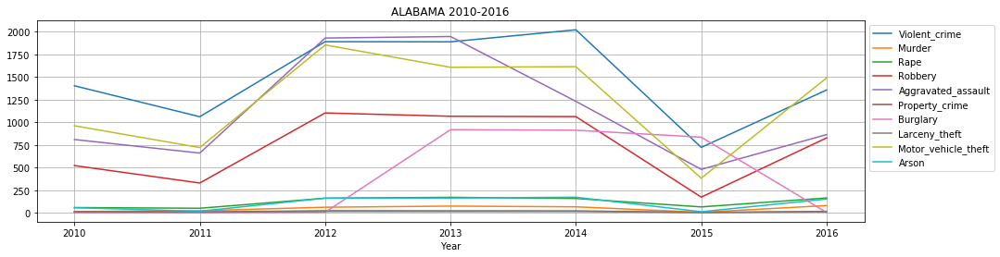

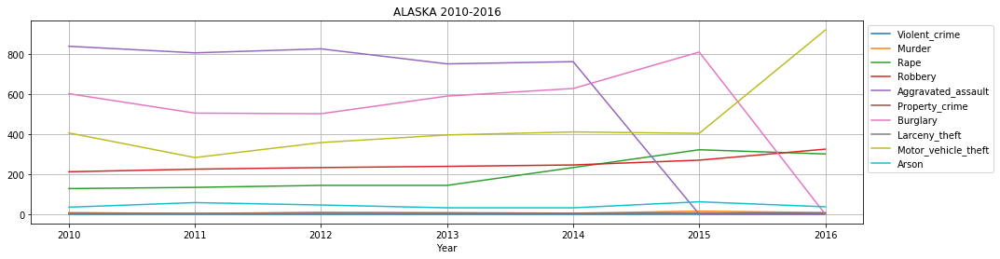

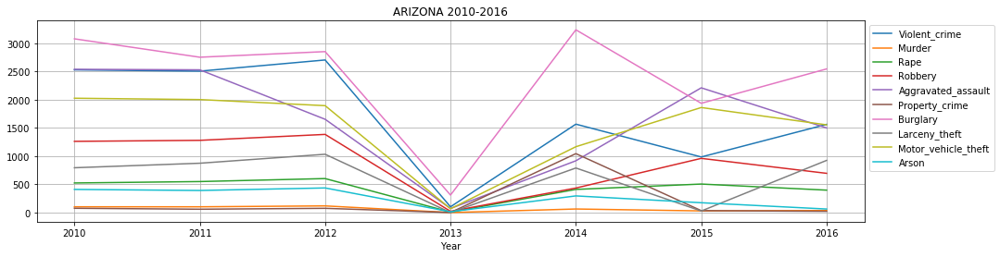

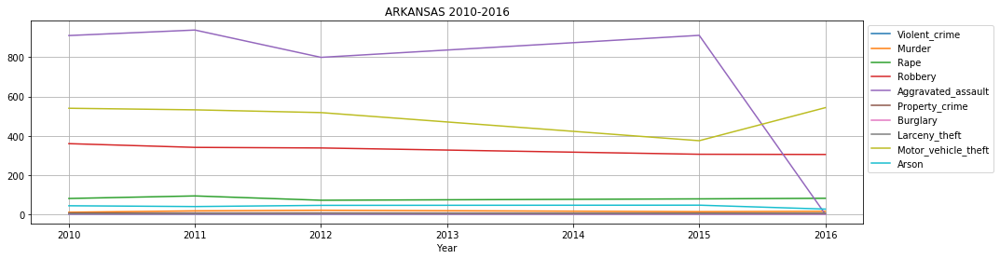

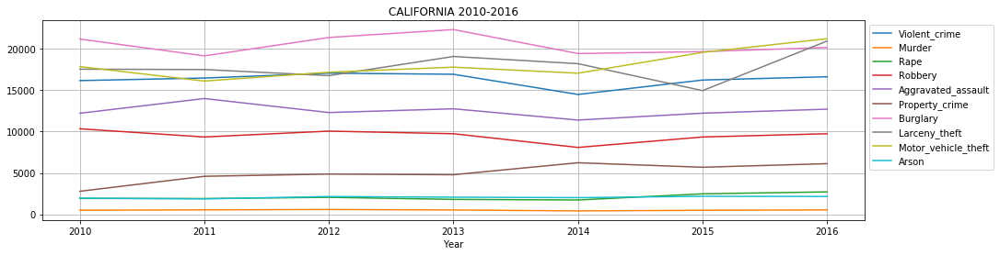

...

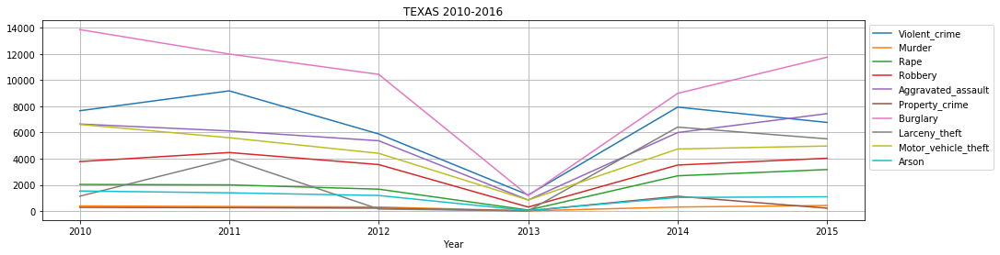

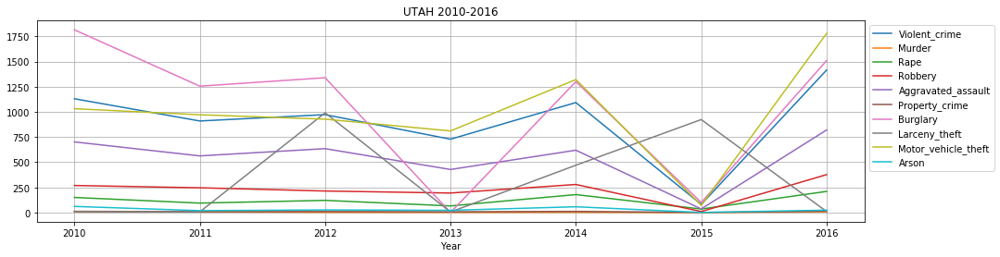

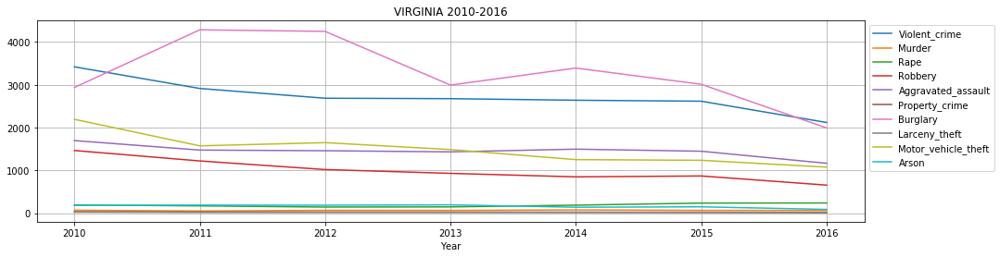

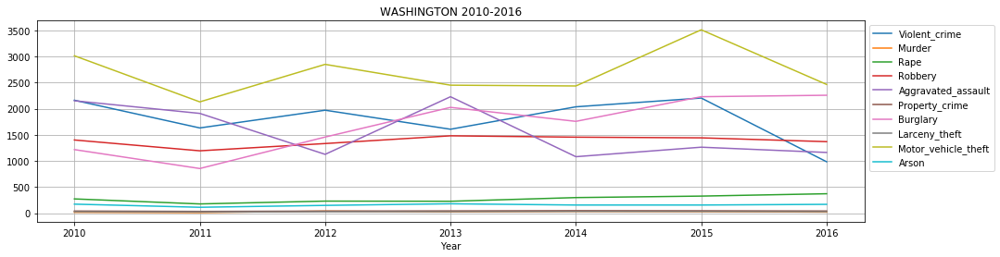

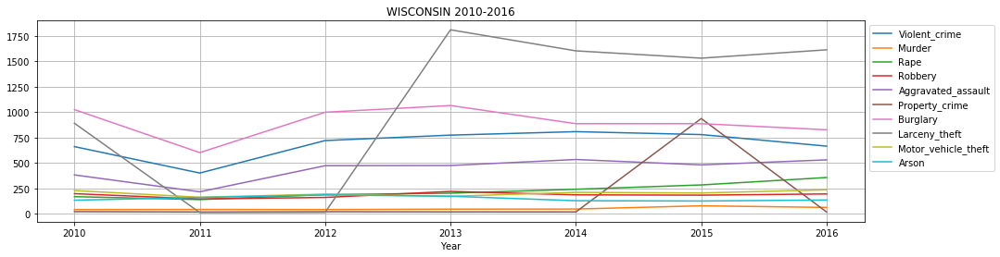

In [13]:
StateByYear  = DataSet.groupby(by=['State','Year'],as_index=False).sum()

for key in StateByYear['State'].drop_duplicates():
    Statistic = StateByYear[StateByYear['State'] == key].drop(['Population'], axis=1)

    x = Statistic.plot(kind='line',grid = True,legend = False,figsize=(16,4),x='Year',title=str(key)+' 2010-2016')

    x.legend(bbox_to_anchor=(1, 1))
    plt.show()

<p>
   from  our study the line plot shows that there was a sharp decrease in all crime from 2014-2016 in ALABAMA.

In ALASKA, the line plot shows there is a sharp decrease in all crime  from 2014-2016 expect crime like violent crime which has a shrap increase from 2015-2016.

In ARIZONA, our study the line plot shows a sharp increase in all crime from 2013-2104 and a decrease between 2015-2016.

In ARKANSAS, our study the line plot shows that the all crimes have almost the same rate of occurence between 2010-2016 expect AGGRAVATED_ASSUALT which has a decrease crime rate between 2015-2016.


In CALIFORNIA, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In COLORADO, our study the line plot shows a sharp increase in all crime from 2015-2106 and a decrease between 2013-2014.

In CONNECTICUT, our study the line plot shows a sharp increase in all crime from 2014-2015 and a decrease between 2013-2014.

In DISTRICT OF COLUMBIA , our study the line plot shows a sharp increase in RAPE from 201O-2016 and other crimes has almost the same crime rate between 2010-2016.

In FLORIDA, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In GEORGIA, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In HAWAI, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In IDAHO, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In ,ILLINOIS our study shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In INDIANA, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In IOWA, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In KANSAS, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In KENTUCKY, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In LOUISIANA, our study shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.
    
In MARYLAND, our study shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In MICHIGAN, our study the line plot shows a sharp increase in all crime from 2015-2016 and a decrease between 2013-2014.

In MINNESOTA, our study the line plot shows a sharp decrease in all crime from 2015-2016 expect BURGLARY which shows a sharp inecrease between 2015-2016.
<p/>

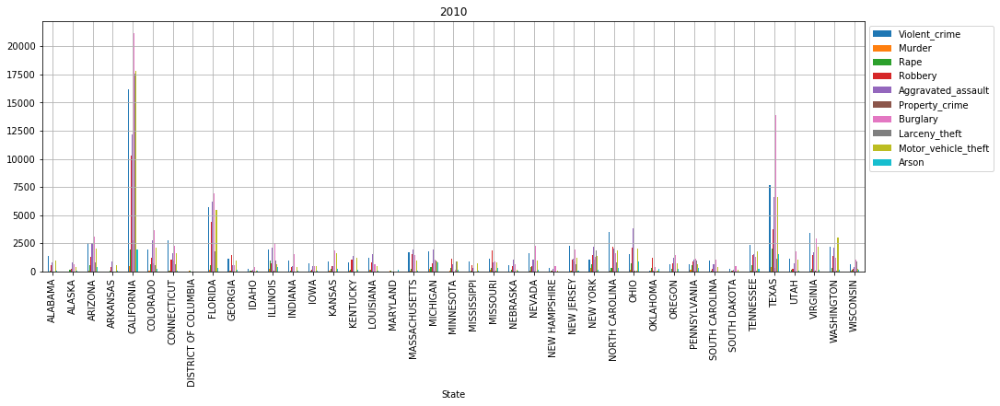

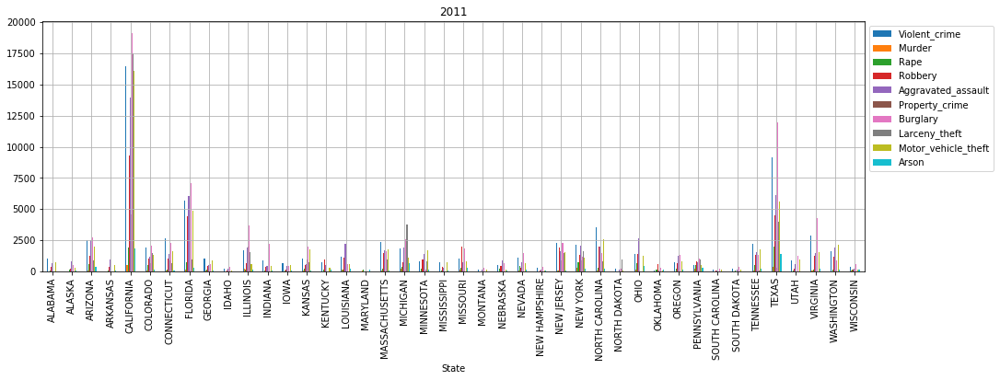

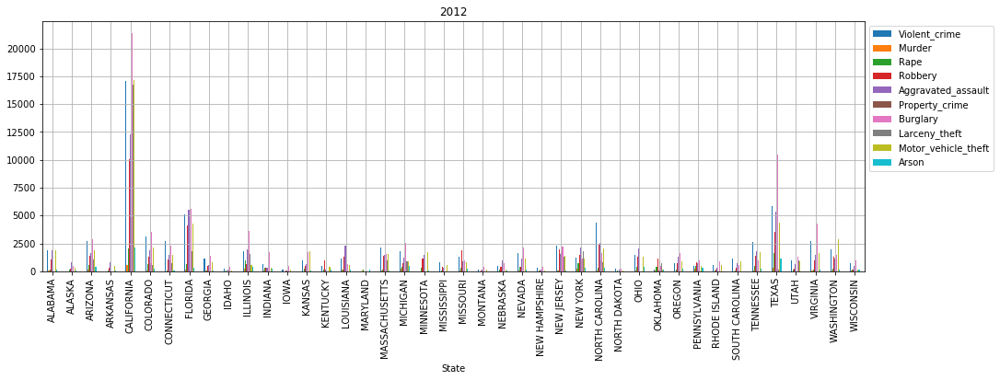

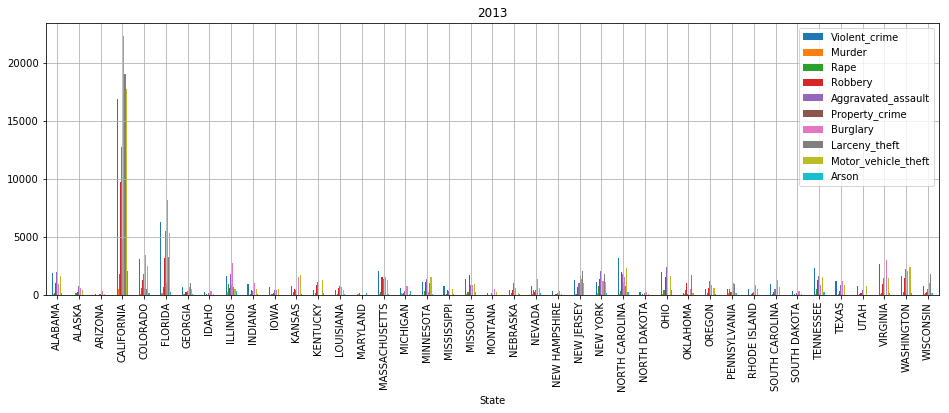

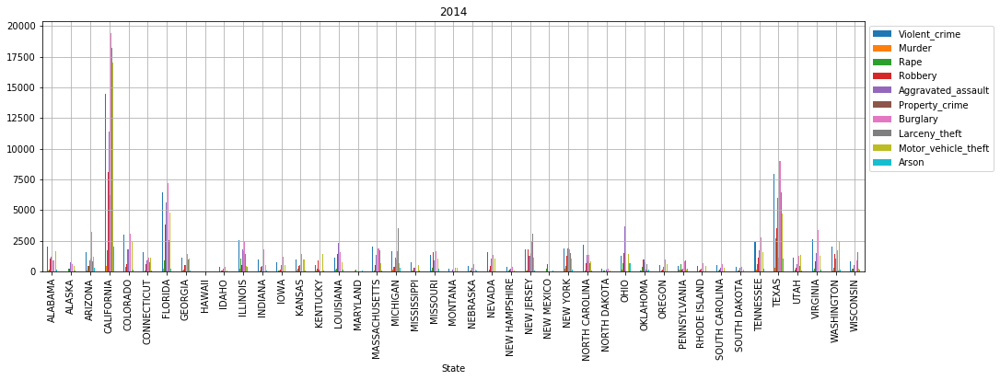

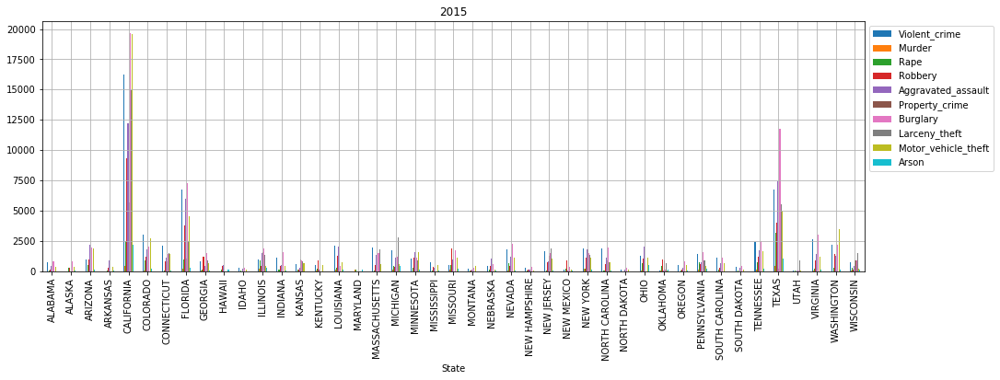

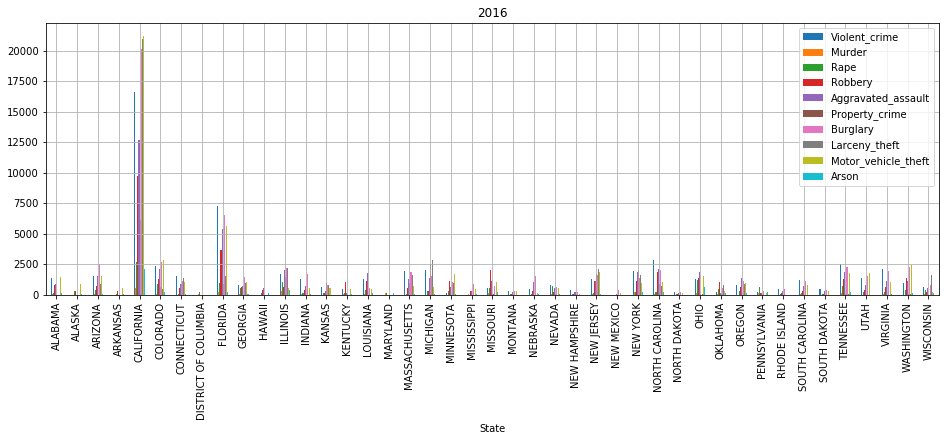

In [14]:
StateByTotalYear  = DataSet.groupby(by=['State','Year'],as_index=False).sum()

for key in StateByTotalYear['Year'].drop_duplicates():
    Statistic = StateByTotalYear[StateByTotalYear['Year'] == key].drop(['Population', 'Year'], axis=1)

    x = Statistic.plot(kind='bar',grid = True,legend = False,figsize=(16,5),x='State',title=str(key))

    x.legend(bbox_to_anchor=(1, 1))
    plt.show()

These graphs show the crimes committed over the years in the various states. It is interesting to see that California is the state with the highest percentage of crimes, followed by Texas. These two states differ greatly from the others by percentage of crimes.

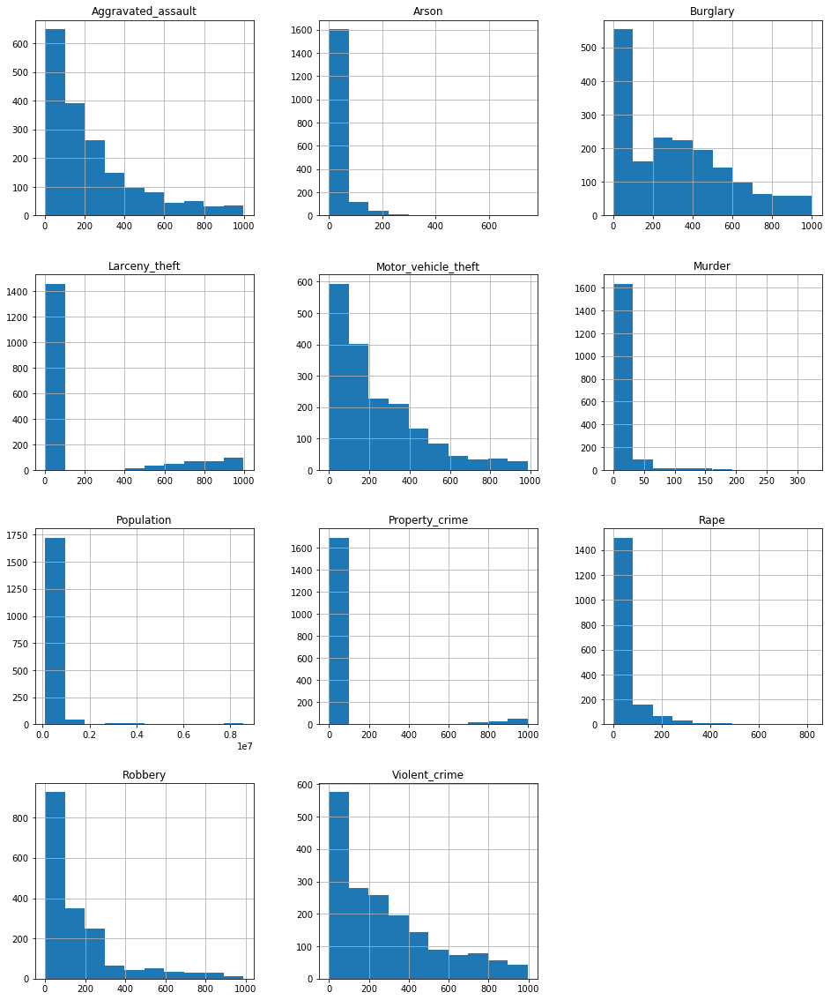

In [15]:
pd.DataFrame(DataSet.drop(['Year'], axis=1)).hist(figsize=(16,20))
plt.show()

<h2><b>Solution:</b></h2><br>  3) We will present data state-wise for US on map and would also do the statistical analysis.

- MergeToCoordinated() combines the dataset with the coordinates of each state (used to represent cities on the map)

In [16]:
def MergeToCoordinated(Dataset):
    Coordinated = pd.read_csv('Coordinated.csv', sep=',')
    return pd.merge(Dataset, Coordinated, on='State', how='left')

- getColor () returns a color based on a given value, based on a range [min - max]

In [17]:
def getColor(Min,Max,val):
    e = (Max-Min)/5
    Maxe = Max-e
    Max2e = Max-(2*e)
    Min2e = Min+(2*e)
    Mine = Min+e
    
    if val <= Max and val > Maxe:
        return '#FF4040'
    if val <= Maxe and val > Max2e:
        return '#FF9F9F'    
    if val <= Max2e and val > Min2e:
        return '#FF8141'
    if val <= Min2e and val > Mine:
        return '#E1E140'
    if val <= Mine and val >= Min:
        return '#00C200'

- PercentageCalculationByState() Calculates in which percentage a given crime (eg rape) is performed in one state compared to all the USA. In fact 100% is the sum of all the rows of the column representing that crime (in our example the sum of all the rows of the turnip column)

In [18]:
def PercentageCalculationByState(DataSet):

    SumState = DataSet.groupby(by='State',as_index=False).sum().drop(['Year'], axis=1)
    SumTotal = DataSet.groupby(by='Year',as_index=False).sum().drop(['Year'], axis=1)

    for index in SumState.index:
        for key in SumTotal.keys():
            if key != 'State':
                SumState.at[index,key] = (SumState.at[index,key] * 100)/SumTotal[key]
      
    return MergeToCoordinated(SumState)

- Function that returns the US map. For each state on the map there is a stamp and a pop up showing all the data related to this status. The stamp changes color depending on the percentage of turnips in that state (red if the percentage of turnips is among the highest and green if it is the lowest).

In [19]:
def getMapUSA(DataSet,SelColumn='Rape'):

    # Center the map on USA
    USA = (20.3, -99.2)  #tiles='Stamen Toner'
    mapp = folium.Map(height=1000,location=USA,zoom_start=4.4)
    Min = DataSet[SelColumn].min()
    Max = DataSet[SelColumn].max()
    
    for index in range(len(DataSet)):
     
        if not pd.isnull(DataSet['latitudine'][index]):
            if not pd.isnull(DataSet['longitudine'][index]):
                Info = ''
                for key in DataSet.keys():
                    Label = ''
                    for resolve in set(key.split()):
                        if Label != '':
                            Label = Label+' '+resolve
                        else: Label = resolve
        
                    if Label == 'State':
                        Info += '<b>State:</b> '+str(DataSet[key][index])+'<br>'
                        
                    if Label == 'Violent_crime' or Label == 'Murder' or Label == 'Rape' \
                    or Label == 'Robbery' or Label == 'Aggravated_assault' \
                    or Label == 'Burglary' or Label == 'Larceny_theft' or Label == 'Property_crime' \
                    or Label == 'Motor_vehicle_theft' or Label == 'Arson':
                        Info += '<b>'+Label+':</b> '+str(DataSet[key][index])[:4]+'%<br>'  

                        
                color = '#{:02x}{:02x}{:02x}'.format(*map(lambda x: random.randint(0, 255), range(3)))
   
                folium.RegularPolygonMarker(
                [DataSet['latitudine'][index], DataSet['longitudine'][index]],
                popup= Info,
                fill_color= getColor(Min,Max,DataSet[SelColumn][index]),
                number_of_sides=10,
                radius=8
                ).add_to(mapp) 
    

    return mapp

- This function returns a set of information year by year

In [20]:
def describeByYear(DataSet):
    Control = False
    for Year in DataSet['Year'].drop_duplicates():
        if Control:
            x = getByColumn(DataSet,'Year',Year).describe().drop('Year',axis=1)
            x['Year'] = str(Year)
            Merge = pd.concat([Merge, x])
        else: 
            Merge = getByColumn(DataSet,'Year',Year).describe().drop('Year',axis=1)
            Merge['Year'] = str(Year)
            Control = True
            
    return Merge

In [21]:
Year2016 = getByColumn(DataSet,'Year',2015) # I take only the year of interest
Percentage = PercentageCalculationByState(Year2016) # I group the crimes of each city by state

In [22]:
getMapUSA(Percentage,'Murder') # I print the map of the United States showing the color of the impact 
                               # of turnips in the territory in 2016

In [23]:
describeByYear(DataSet)

,Population,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson,Year
count,2.680000e+02,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,2010
mean,3.060341e+05,278.927923,12.735075,52.893657,185.367731,254.749414,28.409470,314.115056,115.149937,244.201045,38.827425,2010
std,6.079360e+05,257.457061,28.623881,81.691280,211.860080,245.520013,139.163833,291.294492,282.842140,225.036301,73.671418,2010
min,9.529000e+04,0.000000,0.000000,0.000000,1.154000,0.000000,0.000000,1.005000,0.000000,1.004000,0.000000,2010
25%,1.174950e+05,55.000000,1.000000,14.000000,49.750000,71.000000,1.902500,3.103500,1.595500,75.750000,7.000000,2010
50%,1.617550e+05,239.000000,4.000000,27.500000,108.000000,178.500000,3.052000,279.000000,2.870000,176.000000,16.000000,2010
75%,2.578915e+05,414.500000,11.000000,55.000000,234.250000,361.250000,6.538500,516.250000,7.405250,363.500000,40.500000,2010
max,8.175133e+06,966.000000,229.000000,774.500000,990.000000,995.000000,971.000000,999.000000,988.000000,957.000000,718.000000,2010
count,2.670000e+02,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000,2011
mean,3.055361e+05,280.880273,12.531835,48.951311,171.764000,242.735805,44.205322,304.939884,147.425052,225.298285,33.100187,2011


<p>From the overall crime study of our DATASET from 2010-2016 VIOLENT CRIME has the highest mean value in 2012 this shows that the crime has the higest impact in 2012. 

The overall crime study of our DATASET from 2010-2016 MURDER has the highest mean value in 2016 this shows that the crime has the higest impact in 2016

The overall crime study of our DATASET from 2010-2016 RAPE has the highest mean value in 2014 this shows that the crime has the higest impact in 2014.

The overall crime study of our DATASET from 2010-2016 ROBBERY has the highest mean value in 2010 this shows that the crime has the higest impact in 2010.

The overall crime study of our DATASET from 2010-2016 AGGRAVATED ASSUALT has the highest mean value in 2011 this shows that the crime has the higest impact in 2011.

The overall crime study of our DATASET from 2010-2016 PROPERTY CRIME has the highest mean value in 2013 this shows that the crime has the higest impact in 2013.

The overall crime study of our DATASET from 2010-2016 BULGRARY has the highest mean value in 2012 this shows that the crime has the higest impact in 2012.

The overall crime study of our DATASET from 2010-2016 LARCENY THEFT has the highest mean value in 2015 this shows that the crime has the higest impact in 2015.

The overall crime study of our DATASET from 2010-2016 MOTOR VECHICLE THEFT has the highest mean value in 2012 this shows that the crime has the higest impact in 2012.

The overall crime study of our DATASET from 2010-2016 ARSON has the highest mean value in 2013 this shows that the crime has the higest impact in 2013. <P/>


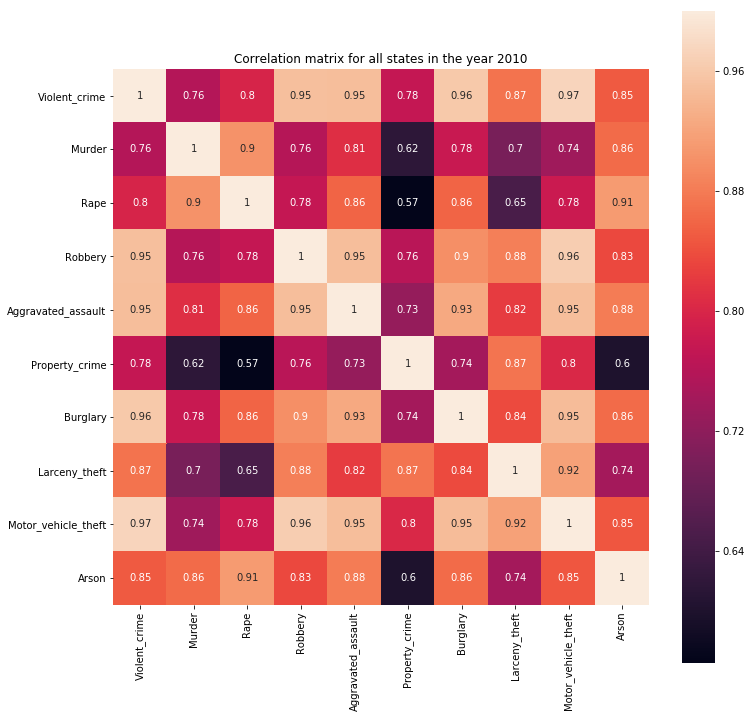

Motor_vehicle_theft  Violent_crime    0.973707
                     Robbery          0.964369
Burglary             Violent_crime    0.959832
Robbery              Violent_crime    0.950429
Aggravated_assault   Violent_crime    0.948532
dtype: float64


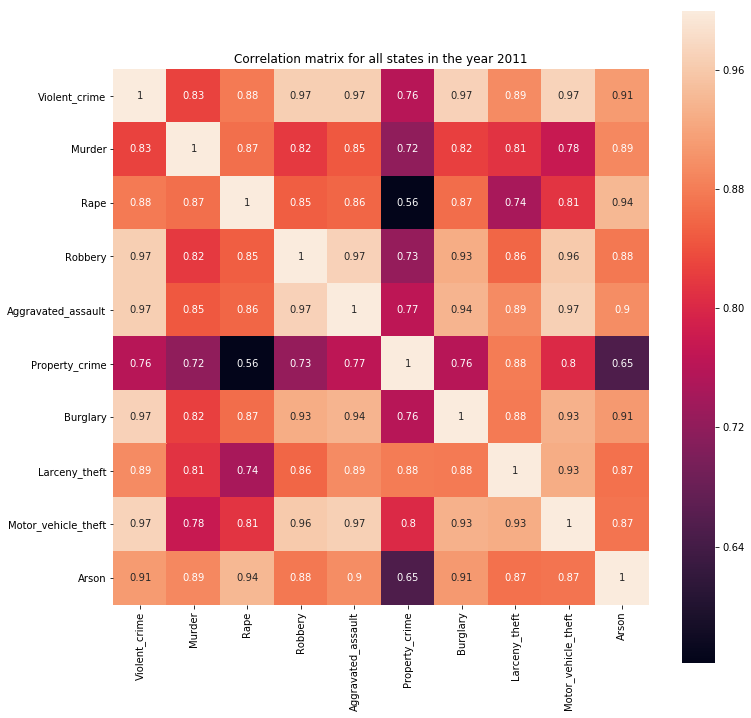

Motor_vehicle_theft  Violent_crime         0.971914
Aggravated_assault   Robbery               0.970621
Burglary             Violent_crime         0.970375
Motor_vehicle_theft  Aggravated_assault    0.969073
Aggravated_assault   Violent_crime         0.967386
dtype: float64


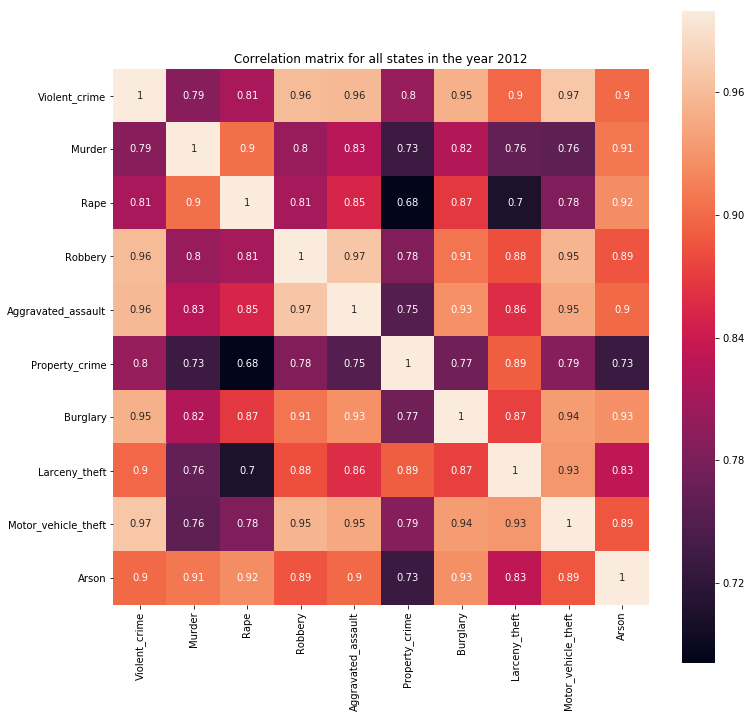

Motor_vehicle_theft  Violent_crime    0.969743
Aggravated_assault   Robbery          0.967617
Robbery              Violent_crime    0.959890
Aggravated_assault   Violent_crime    0.957951
Motor_vehicle_theft  Robbery          0.954367
dtype: float64


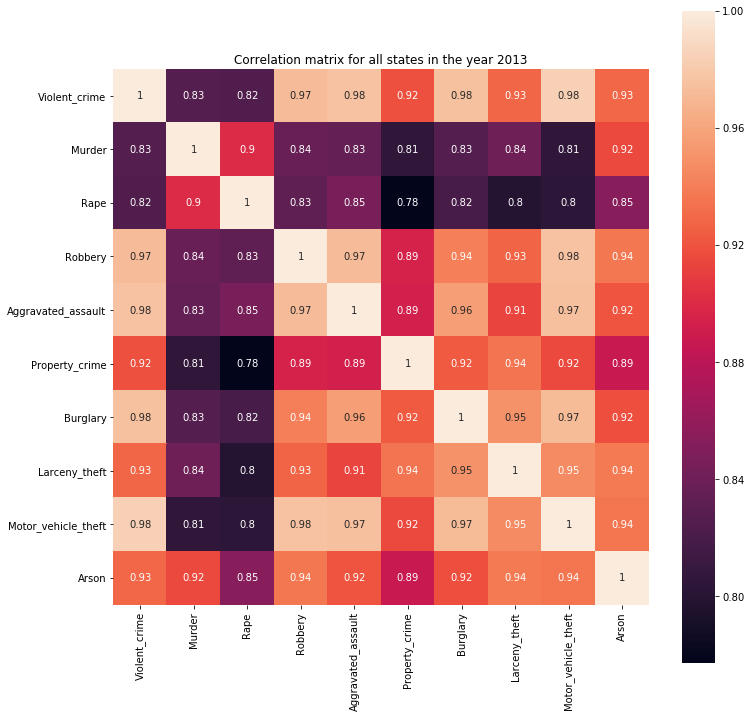

Motor_vehicle_theft  Violent_crime         0.984106
                     Robbery               0.976174
Aggravated_assault   Violent_crime         0.975912
Burglary             Violent_crime         0.975534
Motor_vehicle_theft  Aggravated_assault    0.974505
dtype: float64


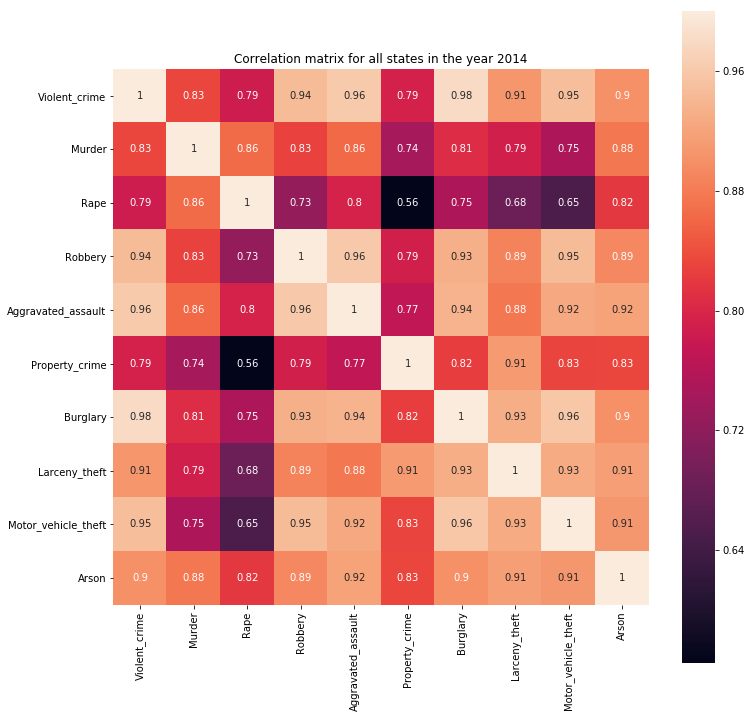

Burglary             Violent_crime    0.981015
Aggravated_assault   Violent_crime    0.961402
                     Robbery          0.959866
Motor_vehicle_theft  Burglary         0.958092
                     Violent_crime    0.948331
dtype: float64


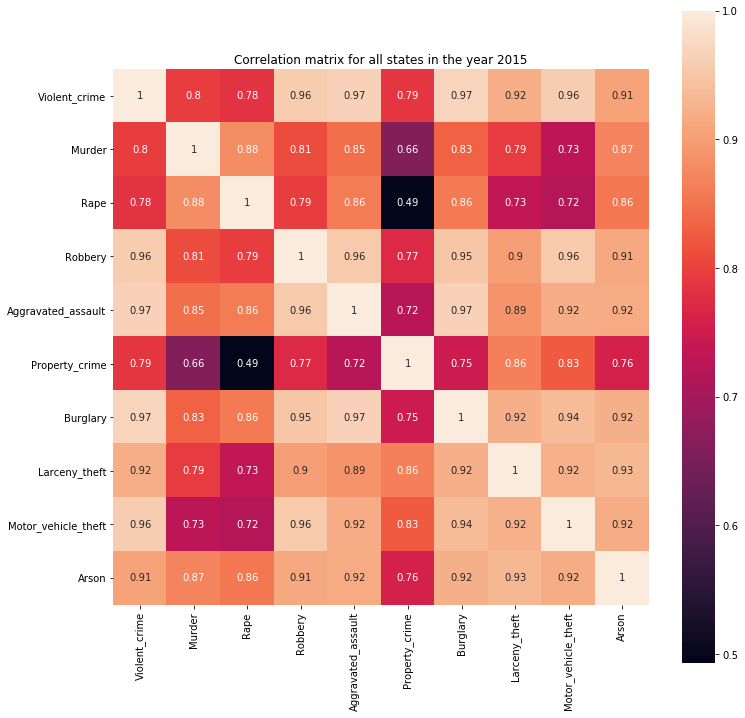

Burglary             Violent_crime         0.968405
                     Aggravated_assault    0.966140
Aggravated_assault   Violent_crime         0.965799
Motor_vehicle_theft  Violent_crime         0.959382
Robbery              Violent_crime         0.956860
dtype: float64


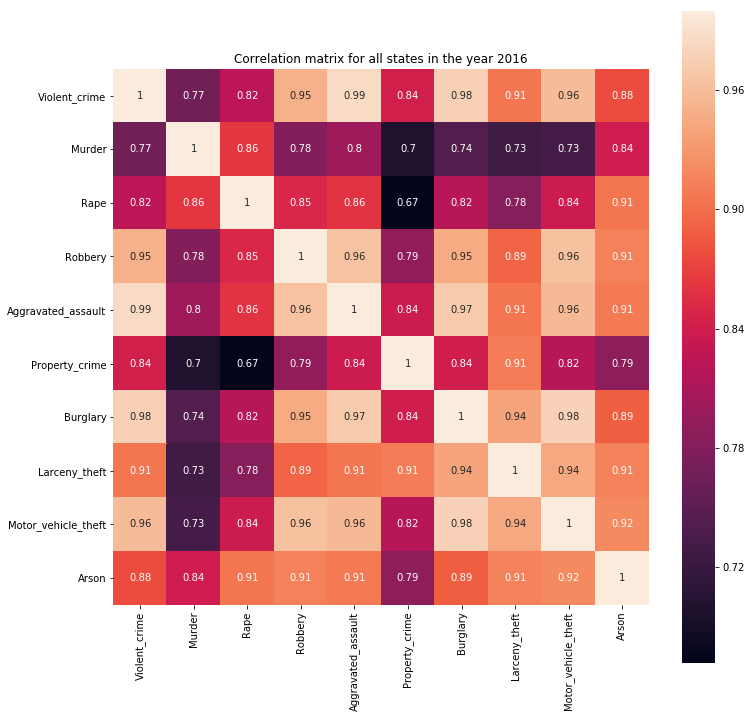

Aggravated_assault   Violent_crime         0.985432
Motor_vehicle_theft  Burglary              0.977400
Burglary             Violent_crime         0.976506
                     Aggravated_assault    0.970841
Aggravated_assault   Robbery               0.964555
dtype: float64


In [24]:
StateByTotalYear  = DataSet.groupby(by=['State','Year'],as_index=False).sum()

for key in StateByTotalYear['Year'].drop_duplicates():
    Statistic = StateByTotalYear[StateByTotalYear['Year'] == key].drop(['State','Population','Year'], axis=1)

    matrix_corr = Statistic.corr()
    
    f, ax = plt.subplots(figsize=(12,12))
    sns.heatmap(matrix_corr,square=True,ax=ax,annot=True)
    ax.set_title('Correlation matrix for all states in the year '+str(key))
    plt.show()
    
    MatrixBool = np.tril(np.ones(matrix_corr.shape)).astype(np.bool)
    for index in range(0,matrix_corr.shape[0]):
        MatrixBool[index][index] = False
    correlations = matrix_corr.where(MatrixBool)
    print(correlations.stack().nlargest(5))  

<p>From the correlation matrix, we have found that in 2010 VIOLENT CRIME is strongly correlated with the following crimes ROBBERY, AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2011 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT and aslo AGGRAVATED ASSUALT is strongly correlated with ROBBERY AND MURDER this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2012 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT and also BULGRARY is strongly correlated with ROBBERY AND MURDER this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2013 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT and also MOTOR VECHILE THEFT is strongly correlated with ROBBERY,BULGRARY, MURDER this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2014 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT and also MOTOR VECHILE THEFT is strongly correlated with ROBBERY,BULGRARY, MURDER this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2015 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY,MOTOR VECHILE THEFT and also AGGRAVATED ASSUALT is strongly correlated with ROBBERY,BULGRARY this shows that an increase in one leads to an increase in the other and vice - versa.

From the correlation matrix, we have found that in 2016 VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT,BULGRARY and also BULGRARY is strongly correlated with ROBBERY,MOTOR VECHILE THEFT this shows that an increase in one leads to an increase in the other and vice - versa.<p/>

<h2><b>Solution:</b></h2><br>  4)  For more refined analysis we will show a more detailed analysis focused on Los-Angeles for 2010 and 2016.<br>

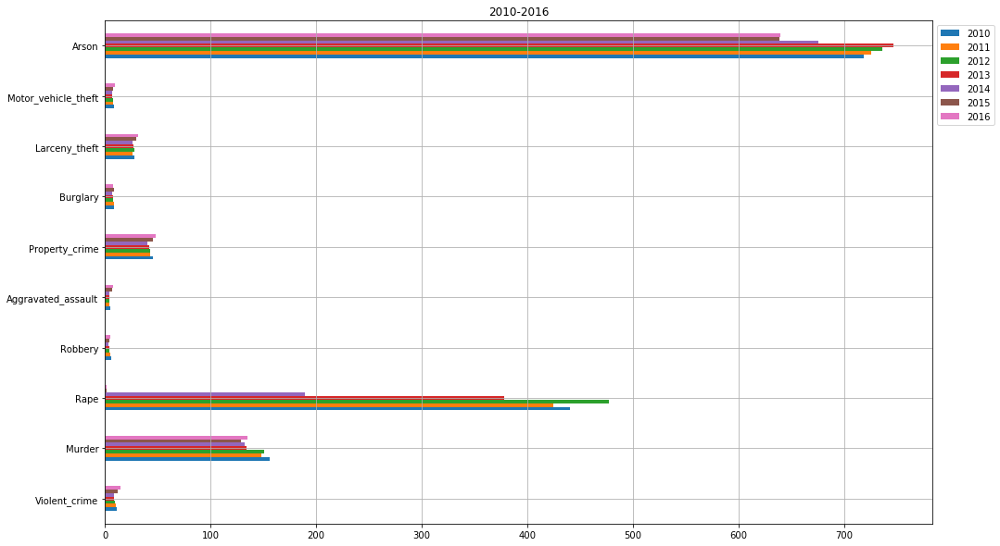

In [25]:
LosAngeles = getByColumn(DataSet,'City','LOS ANGELES') # Query that filters data based on the values of a given 
                                                       # column < in our case the "City" column > and a relative value 
                                                       # in that column <in our case, "Los Angeles" >
# All crimes in the United States are high except for Los Angeles
Crime = LosAngeles.drop(['State','City','Year','Population'], axis=1).T
Crime.rename(columns={0:'2010',1:'2011',2:'2012',3:'2013',4:'2014',5:'2015',6:'2016',}, inplace=True)


x = Crime.plot(kind='barh',grid = True,legend = False,figsize=(16,10),title='2010-2016')

x.legend(bbox_to_anchor=(1, 1))
plt.show()

In [26]:
LosAngeles.drop(['Year','Population'], axis=1).describe()

,Violent_crime,Murder,Rape,Robbery,Aggravated_assault,Property_crime,Burglary,Larceny_theft,Motor_vehicle_theft,Arson
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,10.402000,140.714286,272.969357,4.498857,5.121000,43.684571,7.936000,28.109000,7.639571,696.642857
std,2.096769,10.672617,207.416541,0.680499,1.486237,2.767323,0.532168,1.903322,0.903545,45.527203
min,8.117000,129.000000,1.073000,3.619000,3.780000,39.703000,6.875000,26.428000,6.397000,638.000000
25%,8.939000,133.000000,95.356250,4.027500,4.284000,42.300500,7.839500,26.755500,7.159500,657.000000
50%,9.957000,135.000000,378.000000,4.409000,4.464000,43.051000,7.979000,27.766000,7.343000,718.000000
75%,11.325000,149.500000,432.000000,4.932000,5.538500,45.028000,8.261500,28.696500,8.240500,730.250000
max,14.212000,156.000000,477.000000,5.545000,7.958000,48.381000,8.496000,31.665000,8.937000,746.000000


<p> the most frequent crime from 2010-2016 in Los Angeles is ARSON because it has the highest mean value  and maximum frequency.
    In the considered year interval, our analysis reviewed that ARSON attained it's maximum occurence in 2013 and minimum in 2015 in Los Angeles. 

The crime, BURGLARY has the lowest standard deviation this shows that the crime rate spread is close to the meaan, that is, from 2010-2016, the rate of occurrence is close to each other.

 The less frequent crime from 2010-2016 in Los Angeles is ROBBERY because it has the lowest mean value.
    In the considered year interval, our analysis reviewed that ROBBERY attained it's maximum occurence in 2010 and minimum in 2014 in Los Angeles.

The crime, RAPE has the highest standard deviation this shows a high fluctuation of the crime between 2010 - 2016. According our analysis, from 2013 to 2016 Los Angeles experience a sharp decrease in RAPE, this may have resulted from FBI modification of the definition for RAPE and other RAPE related crimes have been classified in another category of crimes not contained in our dataset.

<p/>

To study the crime in Los Angeles more accurately and make predictions, we use another set of different data from the one used up to now because the previous one accurately reports the situation of crimes in general in the United States.

In [27]:
DataSetLosAngeles = pd.read_csv('Crime_Data_2010_2017.csv',sep=',')
DataSetLosAngeles.columns = DataSetLosAngeles.columns.str.replace(' ', '_')
DataSetLosAngeles['N'] = 1

In [28]:
DataSetLosAngeles.head()

,DR_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_ID,Area_Name,Reporting_District,Crime_Code,Crime_Code_Description,MO_Codes,...,Status_Code,Status_Description,Crime_Code_1,Crime_Code_2,Crime_Code_3,Crime_Code_4,Address,Cross_Street,Location_,N
0,1208575,03/14/2013,03/11/2013,1800,12,77th Street,1241,626,INTIMATE PARTNER - SIMPLE ASSAULT,0416 0446 1243 2000,...,AO,Adult Other,626.0,NaN,NaN,NaN,6300 BRYNHURST AV,NaN,"(33.9829, -118.3338)",1
1,102005556,01/25/2010,01/22/2010,2300,20,Olympic,2071,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,VAN NESS,15TH,"(34.0454, -118.3157)",1
2,418,03/19/2013,03/18/2013,2030,18,Southeast,1823,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,200 E 104TH ST,NaN,"(33.942, -118.2717)",1
3,101822289,11/11/2010,11/10/2010,1800,18,Southeast,1803,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,88TH,WALL,"(33.9572, -118.2717)",1
4,42104479,01/11/2014,01/04/2014,2300,21,Topanga,2133,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329,...,IC,Invest Cont,745.0,NaN,NaN,NaN,7200 CIRRUS WY,NaN,"(34.2009, -118.6369)",1


<h4>I print the ordered list of crimes from the most frequent to the least frequent. For reasons of readability I print crimes in three tables: the first table shows the first 10 crimes, the second the next 30 crimes and the third the remaining ones.</h4>

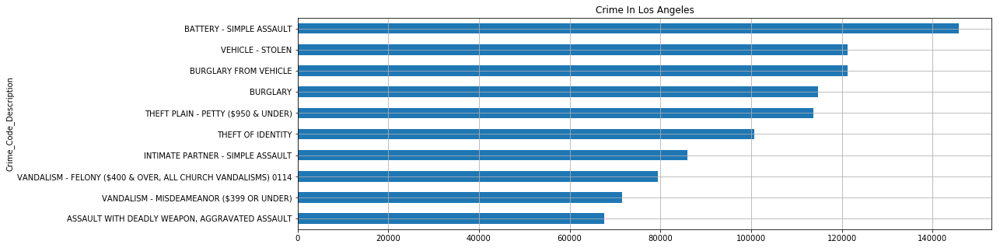

In [29]:
StatisticCrime = DataSetLosAngeles
StatisticCrime = StatisticCrime[['Crime_Code_Description','N']].groupby(by='Crime_Code_Description',as_index=False).sum()
StatisticCrime = StatisticCrime.sort_values('N',ascending=False)
StatisticCrime[:10].sort_values('N').plot(kind='barh',grid = True,legend = False,figsize=(16,5),x='Crime_Code_Description',title='Crime In Los Angeles')

plt.show()

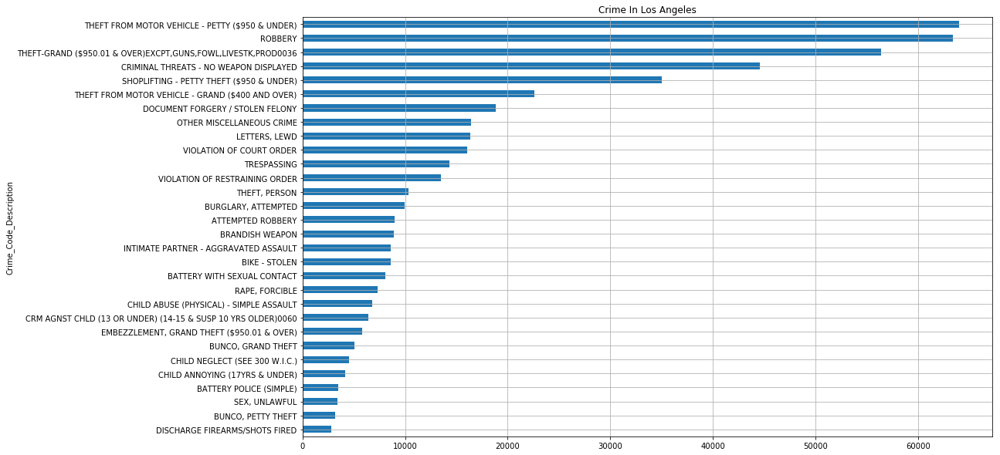

In [30]:
StatisticCrime[10:40].sort_values('N').plot(kind='barh',grid = True,legend = False,figsize=(16,10),x='Crime_Code_Description',title='Crime In Los Angeles')
plt.show()

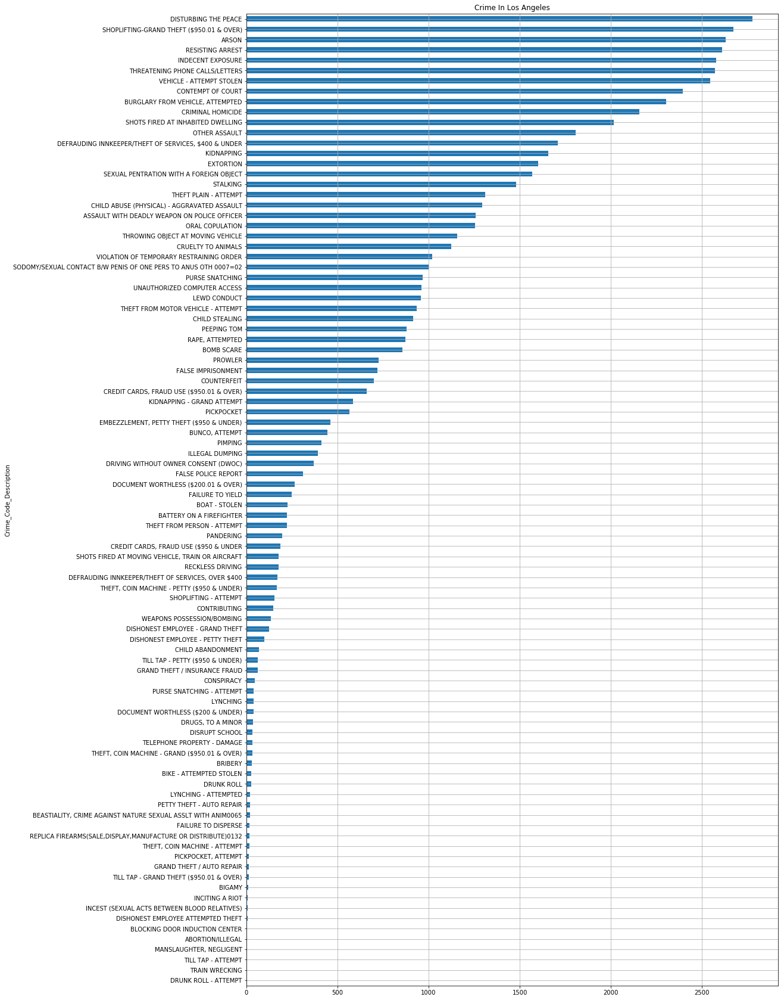

In [31]:
StatisticCrime[40:].sort_values('N').plot(kind='barh',grid = True,legend = False,figsize=(16,30),x='Crime_Code_Description',title='Crime In Los Angeles')

plt.show()

<p>In comparing this data set with our earlier dataset for Los Angeles, we noticed that there is a correlation between the data sets oweing to the fact that most crimes classified under a particular category in our earlier dataset are now being splitted into different components. According to this new data set, the crime with most occurence is BATTERY SIMPLE ASSALT which is not considered in our inital data set. However crimes such as RAPE was re-defined in 2014 by FBI by dropping most of the crimes classified under RAPE, our analysis reflected a sharp decline in the occurence which is further confirmed by our new data set. <p/>

<h4>The following are the 20 roads with the highest crime rate</h4>

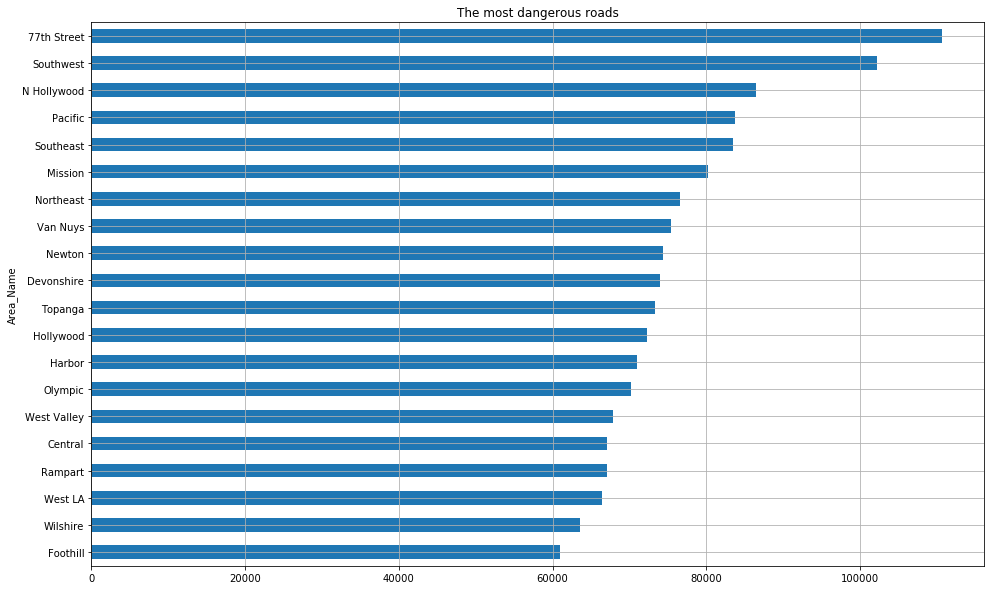

In [32]:

StatisticStreet = DataSetLosAngeles
StatisticStreet = StatisticStreet[['Area_Name','N']].groupby(by='Area_Name',as_index=False).sum()
StatisticStreet = StatisticStreet[StatisticStreet['Area_Name'] != 0]
StatisticStreet = StatisticStreet.sort_values('N',ascending=False)
StatisticStreet[:20].sort_values('N').plot(kind='barh',grid = True,legend = False,figsize=(16,10),x='Area_Name',title='The most dangerous roads')

plt.show()

/anaconda3/envs/NetworkOPT/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


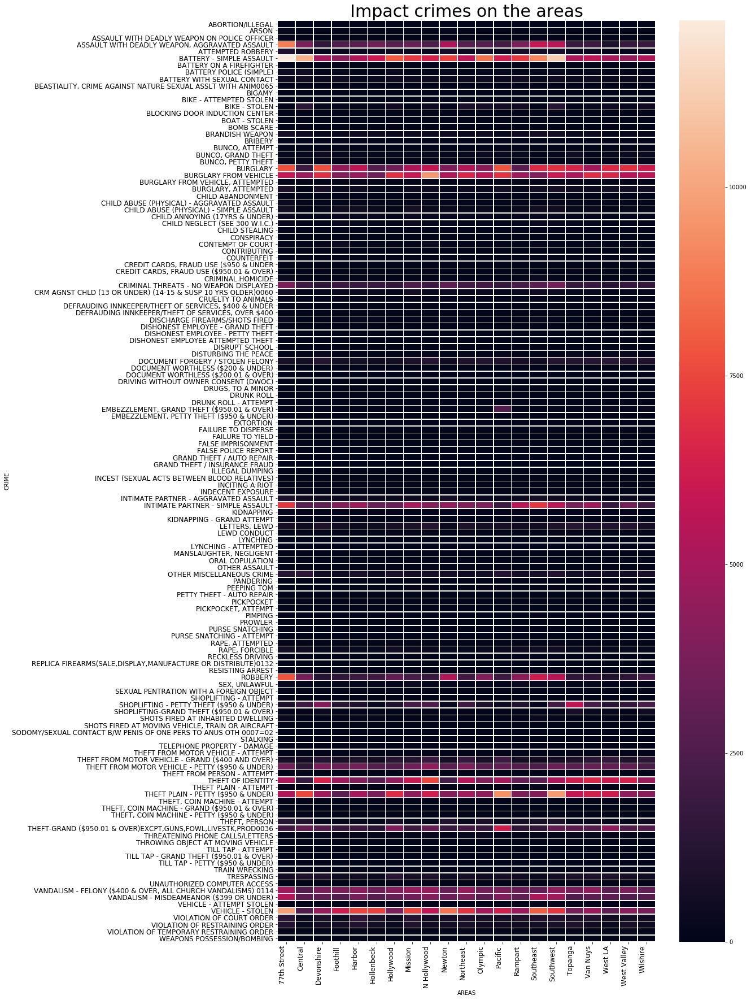

In [33]:
# transform it into a heat map
fig = plt.figure(figsize=(15,30))
ax = sns.heatmap(pd.crosstab(DataSetLosAngeles['Crime_Code_Description'],DataSetLosAngeles['Area_Name']),linewidths=.5)
plt.title('Impact crimes on the areas',fontsize=30)
plt.legend(fontsize=14)
plt.xticks(fontsize=12,rotation=90,ha='right')
plt.yticks(fontsize=12)
plt.xlabel("AREAS")
plt.ylabel("CRIME")
plt.show()

This map shows how crimes have an impact on the streets of Los Angeles. We see black as the predominant color because, in the few colored streets, most of the crimes recorded in the city are concentrated.

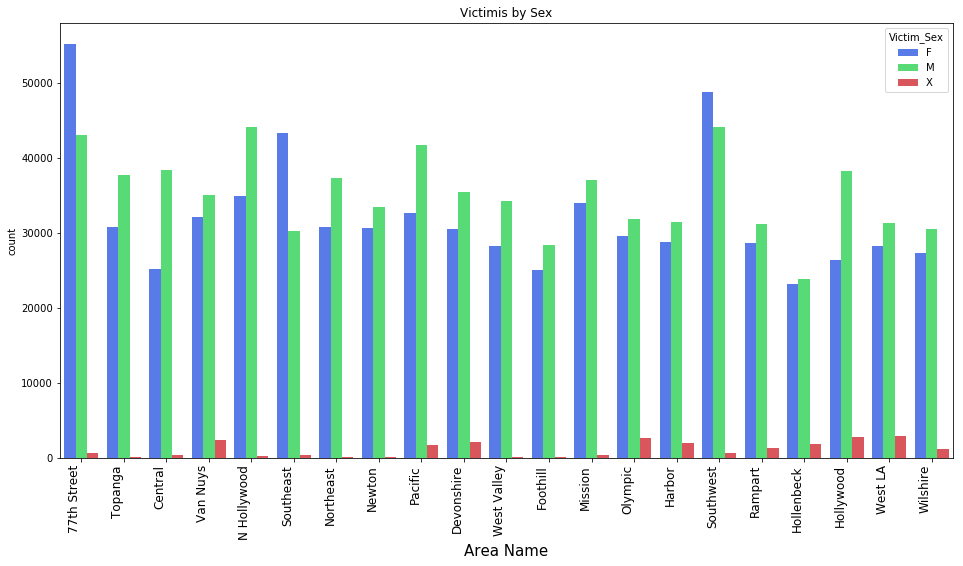

In [34]:
AgeVictimSex = DataSetLosAngeles[DataSetLosAngeles['Victim_Sex'].notnull()]
AgeVictimSex['Victim_Sex'] = AgeVictimSex["Victim_Sex"].replace(['H',0,'-'],'X')
AgeVictimSex['Victim_Sex'].value_counts()

fig,ax = plt.subplots(figsize=(16,8))
sns.countplot(x='Area_Name',hue='Victim_Sex',data=AgeVictimSex,palette='bright',alpha=0.75)
ax.set_title('Victimis by Sex')
ax.set_xlabel('Area Name', fontsize=15);
plt.xticks(fontsize=12,rotation=90,ha='right')
plt.show()

From this graph we see what is the predominant sex in the victim of crime that is distributed on the streets. Then we print the average age of deaths based on gender.

In [35]:
x = DataSetLosAngeles[DataSetLosAngeles['Victim_Age'].notnull()]

f = x[x['Victim_Sex'] == 'F']      
print("Average age of female victims %d years" % (f['Victim_Age'].mean()))

m = x[x['Victim_Sex'] == 'M']      
print("Average age of male victims %d years" % (m['Victim_Age'].mean()))

Average age of female victims 37 years
Average age of male victims 38 years


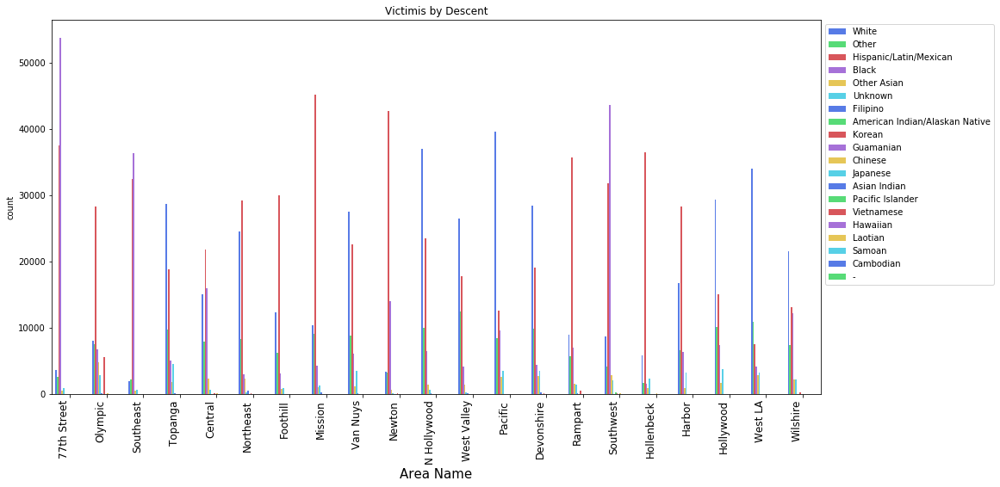

In [36]:
Victim_Descent = DataSetLosAngeles#['Victim_Descent']

Descent = {'A' : 'Other Asian',
           'B' : 'Black' ,
           'C' : 'Chinese' ,
           'D' : 'Cambodian' ,
           'F' : 'Filipino' ,
           'G' : 'Guamanian' ,
           'H' : 'Hispanic/Latin/Mexican' ,
           'I' : 'American Indian/Alaskan Native' ,
           'J' : 'Japanese' ,
           'K' : 'Korean' ,
           'L' : 'Laotian' ,
           'O' : 'Other' ,
           'P' : 'Pacific Islander' ,
           'S' : 'Samoan' ,
           'U' : 'Hawaiian' ,
           'V' : 'Vietnamese' ,
           'W' : 'White' ,
           'X' : 'Unknown' ,
           'Z' : 'Asian Indian'}


Victim_Descent['Victim_Descent'] = Victim_Descent['Victim_Descent'].replace(Descent)


fig,ax = plt.subplots(figsize=(16,8))
sns.countplot(x='Area_Name',hue='Victim_Descent',data=Victim_Descent, palette='bright',alpha=0.75)
ax.set_title('Victimis by Descent')
ax.set_xlabel('Area Name', fontsize=15);
ax.legend(bbox_to_anchor=(1, 1))
plt.xticks(fontsize=12,rotation=90,ha='right')
plt.show()


- These are the most used weapons:

In [37]:
DataSetLosAngeles['Weapon_Description'].value_counts().head(20)

STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)    319818
VERBAL THREAT                                      43814
UNKNOWN WEAPON/OTHER WEAPON                        40746
HAND GUN                                           25352
SEMI-AUTOMATIC PISTOL                              10096
KNIFE WITH BLADE 6INCHES OR LESS                    9335
OTHER KNIFE                                         6946
UNKNOWN FIREARM                                     6037
VEHICLE                                             5348
REVOLVER                                            4567
BOTTLE                                              3806
BLUNT INSTRUMENT                                    3347
ROCK/THROWN OBJECT                                  3233
STICK                                               3200
CLUB/BAT                                            3155
FOLDING KNIFE                                       3065
SIMULATED GUN                                       2842
KITCHEN KNIFE                  

<h2><b>Solution:</b></h2><br>  5)  We will show crimes rates in Los Angeles over map and compare the crimes for six years.<br>

In [38]:
def getMapLosAngeles(DataSet):
    
    K = 10 # I choose K10 because from the map of incidences made previously we see that the most widespread crimes are about 15

    color = np.array(['#{:02x}{:02x}{:02x}'.format(*map(lambda x: random.randint(0, 255), range(3)))for z in range(K)])

    df = DataSet[['Crime_Code','Area_ID']]

    # Clustering of crimes
    km = KMeans(n_clusters=K, init='k-means++', n_init=10)
    km.fit(df)
    y_kmeans = km.predict(df)

    
    pd.set_option('mode.chained_assignment', None)
    DataSet.loc.__setitem__((slice(None), 'Cluster'), y_kmeans)    
    
    Cordinate = DataSet['Location_']
    # Center the map on USA
    LOS_ANGELES = (33.800, -118.2436800)  #tiles='Stamen Toner'
    mapp = folium.Map(height=1000,location=LOS_ANGELES,zoom_start=10)
    
    for index in range(len(DataSet)):
        x,y = DataSet['Location_'][index][1:len(DataSet['Location_'][index])-1].replace(' ','').split(',')
        folium.RegularPolygonMarker([float(x), float(y)],
                                    fill_color= color[DataSet['Cluster'][index]],
                                    number_of_sides=DataSet['Cluster'][index],
                                    popup= DataSet['Crime_Code_Description'][index],
                                    radius=6).add_to(mapp)        
    

    plt.subplots(figsize=(16,8))
    plt.scatter(df['Crime_Code'], df['Area_ID'], c=color, s=K*20, cmap='viridis')

    centers = km.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c=color, s=200, alpha=0.5, marker="x")  
    
    return mapp

<h4>Clustering of crimes</h4>

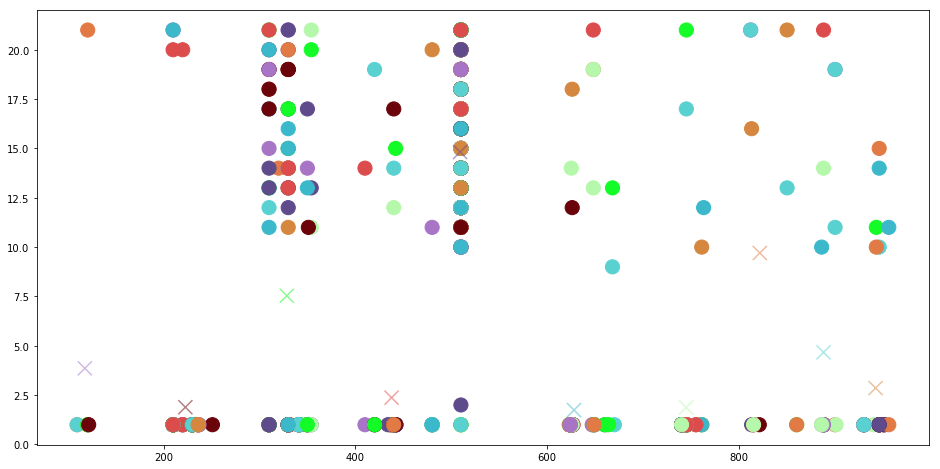

In [39]:
getMapLosAngeles(DataSetLosAngeles[:1000])

In [40]:
matrix_corr = LosAngeles.drop(['Year','State','Population'], axis=1).corr()

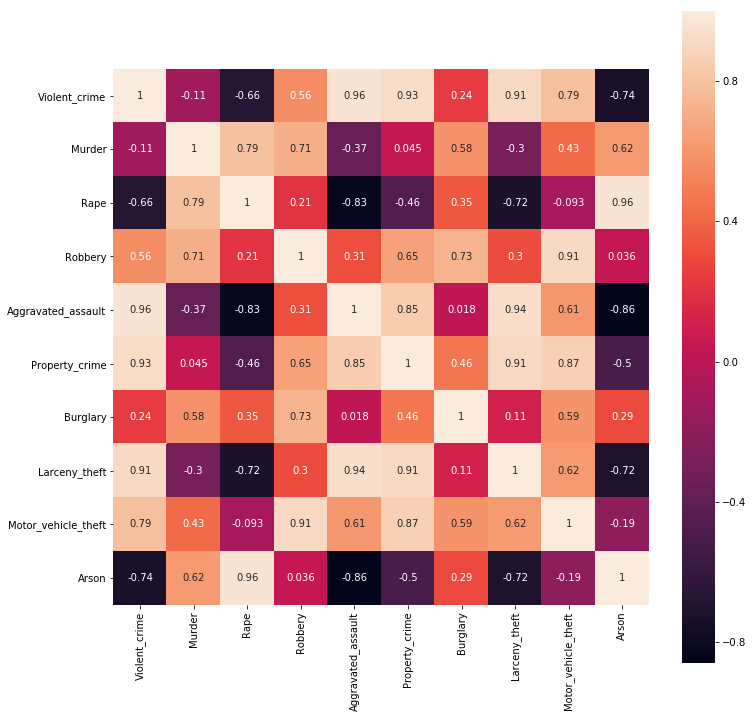

In [41]:
f, ax = plt.subplots(figsize=(12,12))
sns.heatmap(matrix_corr,square=True,ax=ax,annot=True)
plt.show()

In [42]:
# More related crimes
MatrixBool = np.tril(np.ones(matrix_corr.shape)).astype(np.bool)
for index in range(0,matrix_corr.shape[0]):
    MatrixBool[index][index] = False
correlations = matrix_corr.where(MatrixBool)
correlations.stack().nlargest(5)

Aggravated_assault  Violent_crime         0.960308
Arson               Rape                  0.959777
Larceny_theft       Aggravated_assault    0.938733
Property_crime      Violent_crime         0.928382
Larceny_theft       Property_crime        0.912521
dtype: float64

<p>From the correlation matrix, we have found that VIOLENT CRIME is strongly correlated with the following crimes  AGGRAVATED ASSUALT, PROPERTY CRIME  and  LARCENY THEFT is strongly correlated with PROPERTY CRIME,AGGRAVATED ASSUALT and also RAPE is strongly correlated with ARSON this shows that an increase in one leads to an increase in the other and vice - versa. Most of the crime in Los Angeles are highly correlated.<p/>

<h4>Crime in Los Angeles in the years 2010-2016</h4>

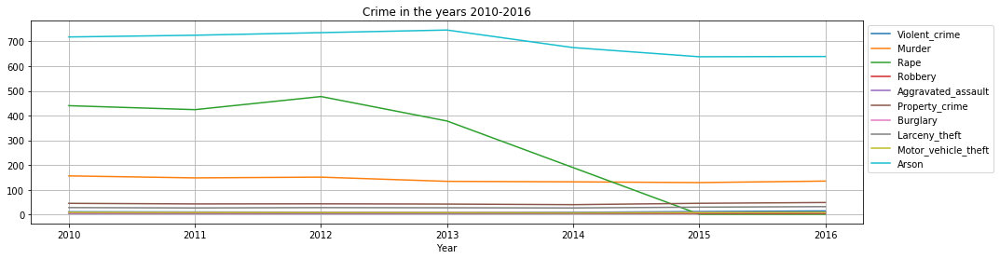

In [43]:
x = LosAngeles.drop(['Population'], axis=1)
x = x.plot(kind='line',grid = True,legend = False,figsize=(16,4),x='Year',title='Crime in the years 2010-2016')

x.legend(bbox_to_anchor=(1, 1))
plt.show()

<p>From  our study the line plot shows that there was a sharp decrease in RAPE from 2013 and this clearly correlate strongly with our DATA DECLERATION which says that from 2013 crime like RAPE was redfined by removing many crimes from it such as FORCIBLE and so on and this leads to the decrease in RAPE.
 
 From our study all other crimes expect RAPE and VIOLENT CRIME have almost the same crime rate or probably have a constant crime rate  in LOS ANGELES, and however VIOLENT CRIME  has a decrease in crime rate in 2013 - 2015 and a little incerase in 2016.<p/>

<h2><b>Solution:</b></h2><br>  6)  For more statistical part, we will be verifying “NULL-Hypothesis’ regarding mean crimes in 2010-2016.<br>

- resolveNullHypothesis : function that calculates the null hypothesis by comparing two years. In input you must have passed the DataSet, year 1 and year 2 (which is the two years you want to compare) and the type of crime. By default, 'Rape' is passed as a type of crime).
- getNullHypothesis : compare all the years in the dataset by printing the result of this comparison indicating the years compared and if the null hypothesis is accepted or not

In [44]:
def resolveNullHypothesis(DataSet,year1,year2,kindOfCrime):    
    
    CurrentYear = getByColumn(DataSet,'Year',year1)
    C_Mean = CurrentYear.mean()
    C_StandarDeviation = CurrentYear.std()
    C_Population = CurrentYear['Population'].sum()
     
    NextYear = getByColumn(DataSet,'Year',year2)
    N_Mean = NextYear.mean()
    N_StandarDeviation = NextYear.std()
    N_Population = NextYear['Population'].sum()

    
    V = math.sqrt( ((C_StandarDeviation[kindOfCrime]**2)/C_Population)+((N_StandarDeviation[kindOfCrime]**2)/N_Population) )
    Z = (C_Mean[kindOfCrime] - N_Mean[kindOfCrime])/V
    
    if -1.96 <= Z and Z >= 1.96:
        return True
    else : return False
    
    
def getNullHypothesis(DataSet):
    
    for Year in DataSet['Year'].drop_duplicates():
        for NextYear in DataSet['Year'].drop_duplicates():
            if Year < NextYear:
                print()
                print('#### '+str(Year)+'-'+str(NextYear)+' ####')
                print()
                for crime in DataSet.keys():
                    if crime != 'State' and crime != 'City' and crime != 'Year' and crime != 'Population':
                        if( resolveNullHypothesis(DataSet,Year,NextYear,crime)):
                            print('    %20s -  Accept null hypothesis' % (crime))
                        else : print('    %20s -  Not Accept null hypothesis' % (crime))
                            

In [45]:
getNullHypothesis(DataSet)


#### 2010-2011 ####

           Violent_crime -  Not Accept null hypothesis
                  Murder -  Accept null hypothesis
                    Rape -  Accept null hypothesis
                 Robbery -  Accept null hypothesis
      Aggravated_assault -  Accept null hypothesis
          Property_crime -  Not Accept null hypothesis
                Burglary -  Accept null hypothesis
           Larceny_theft -  Not Accept null hypothesis
     Motor_vehicle_theft -  Accept null hypothesis
                   Arson -  Accept null hypothesis

#### 2010-2012 ####

           Violent_crime -  Not Accept null hypothesis
                  Murder -  Not Accept null hypothesis
                    Rape -  Accept null hypothesis
                 Robbery -  Accept null hypothesis
      Aggravated_assault -  Accept null hypothesis
          Property_crime -  Not Accept null hypothesis
                Burglary -  Accept null hypothesis
           Larceny_theft -  Accept null hypothesis
     Motor_veh

      Aggravated_assault -  Not Accept null hypothesis
          Property_crime -  Accept null hypothesis
                Burglary -  Accept null hypothesis
           Larceny_theft -  Accept null hypothesis
     Motor_vehicle_theft -  Not Accept null hypothesis
                   Arson -  Accept null hypothesis

#### 2014-2016 ####

           Violent_crime -  Accept null hypothesis
                  Murder -  Not Accept null hypothesis
                    Rape -  Not Accept null hypothesis
                 Robbery -  Not Accept null hypothesis
      Aggravated_assault -  Not Accept null hypothesis
          Property_crime -  Not Accept null hypothesis
                Burglary -  Accept null hypothesis
           Larceny_theft -  Not Accept null hypothesis
     Motor_vehicle_theft -  Not Accept null hypothesis
                   Arson -  Accept null hypothesis

#### 2015-2016 ####

           Violent_crime -  Accept null hypothesis
                  Murder -  Not Accept null hypothesi

<p>From our study we verified the  “NULL-Hypothesis’ regarding mean value of  crimes in 2010-2016 which  is a hypothesis that says there is no statistical significance or statistical difference  between the mean value of a particular type of crime bewteen two given years with 95 percent of confidence.

For example the year interval 2010 -2011 with 95 percent  confidence we either accept or reject the the NULL-Hypothesis which says that the mean of a particular crime is the same in the given year interval 

Violent_crime -  Not Accept null hypothesis shows that  with 95 percent  confidence the mean value is not the same .

Murder -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Rape -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Robbery -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Aggravated_assault -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Property_crime -  Not Accept null hypothesis shows that with 95 percent  confidence the mean value is not the same .

Burglary -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Larceny_theft -  Not Accept null hypothesis shows that with 95 percent  confidence the mean value is not the same .

Motor_vehicle_theft -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same .

Arson -  Accept null hypothesis shows that with 95 percent  confidence the mean value is the same . <p/>

<h2><b>Solution:</b></h2><br>  7) Also, we will try to run regression analysis over the available data set, to predict crimes in 2017.<br><br>The dataset we downloaded to study Los Angeles brings crimes line by line, not making their use simple because it does not allow us to extract useful information for linear regression. So we found it easier to report crimes on columns by grouping them by date. Since the crimes were many compared to the first dataset, we took the first 10 most frequent crimes.

In [46]:
LA_2016 = DataSetLosAngeles[DataSetLosAngeles['Date_Occurred'].str.contains("2016")]
LA_2016['Date_Occurred'] = pd.to_datetime(LA_2016['Date_Occurred'])

LA_2016 = LA_2016[['Date_Occurred','Crime_Code','Crime_Code_Description','N']].groupby(by=['Date_Occurred','Crime_Code','Crime_Code_Description'],as_index=False).sum()


In [47]:
#BATTERY - SIMPLE ASSAULT = 624
#BURGLARY FROM VEHICLE = 330
#VEHICLE - STOLEN = 510
#THEFT PLAIN - PETTY ($950 & UNDER) = 440
#BURGLARY = 310
#INTIMATE PARTNER - SIMPLE ASSAULT = 626
#THEFT OF IDENTITY = 354
#ARSON = 648
#AGGRAVATED_ASSAULT = 230
#ROBBERY = 210

CrimeList = ['Date_Occurred',\
             'ATTERY_SIMPLE_ASSAULT',\
             'BURGLARY_FROM_VEHICLE',\
             'VEHICLE_STOLEN',\
             'THEFT_PLAIN_PETTY',\
             'BURGLARY',\
             'INTIMATE_PARTNER_SIMPLE_ASSAULT',\
             'THEFT_OF_IDENTITY',\
             'ARSON',\
             'AGGRAVATED_ASSAULT',\
             'ROBBERY']

NewDataSetLosAngeles = pd.DataFrame(columns=CrimeList)

cont = 0
for data in LA_2016['Date_Occurred'].drop_duplicates():
    
    x = LA_2016[LA_2016['Date_Occurred'] == data]
    x = x[['Crime_Code','Crime_Code_Description','N']].groupby(by=['Crime_Code_Description'],as_index=False).sum()
    
    
    ATTERY_SIMPLE_ASSAULT = np.nan
    BURGLARY_FROM_VEHICLE = np.nan
    VEHICLE_STOLEN = np.nan
    THEFT_PLAIN_PETTY = np.nan
    BURGLARY = np.nan
    INTIMATE_PARTNER_SIMPLE_ASSAULT = np.nan
    THEFT_OF_IDENTITY = np.nan
    ARSON = np.nan
    AGGRAVATED_ASSAULT = np.nan
    ROBBERY = np.nan
        
    
    for i in range(len(x)):
        if x['Crime_Code'][i] == 624:
            ATTERY_SIMPLE_ASSAULT = x['N'][i]       
        if x['Crime_Code'][i] == 330:
            BURGLARY_FROM_VEHICLE = x['N'][i]          
        if x['Crime_Code'][i] == 510:
            VEHICLE_STOLEN = x['N'][i] 
        if x['Crime_Code'][i] == 440:
            THEFT_PLAIN_PETTY = x['N'][i]             
        if x['Crime_Code'][i] == 310:          
            BURGLARY = x['N'][i]
        if x['Crime_Code'][i] == 626:          
            INTIMATE_PARTNER_SIMPLE_ASSAULT = x['N'][i]            
        if x['Crime_Code'][i] == 354:
            THEFT_OF_IDENTITY = x['N'][i]
        if x['Crime_Code'][i] == 648:
            ARSON = x['N'][i]
        if x['Crime_Code'][i] == 230:        
            AGGRAVATED_ASSAULT = x['N'][i]
        if x['Crime_Code'][i] == 210:        
            ROBBERY = x['N'][i]
  
        
    NewDataSetLosAngeles = NewDataSetLosAngeles.append({'Date_Occurred': data,'ATTERY_SIMPLE_ASSAULT':ATTERY_SIMPLE_ASSAULT,'BURGLARY_FROM_VEHICLE':BURGLARY_FROM_VEHICLE,'VEHICLE_STOLEN':VEHICLE_STOLEN,'THEFT_PLAIN_PETTY':THEFT_PLAIN_PETTY,'BURGLARY':BURGLARY,'INTIMATE_PARTNER_SIMPLE_ASSAULT':INTIMATE_PARTNER_SIMPLE_ASSAULT,'THEFT_OF_IDENTITY':THEFT_OF_IDENTITY,'ARSON':ARSON,'AGGRAVATED_ASSAULT':AGGRAVATED_ASSAULT,'ROBBERY':ROBBERY}, ignore_index=True)



In [48]:
NewDataSetLosAngeles.head()

,Date_Occurred,ATTERY_SIMPLE_ASSAULT,BURGLARY_FROM_VEHICLE,VEHICLE_STOLEN,THEFT_PLAIN_PETTY,BURGLARY,INTIMATE_PARTNER_SIMPLE_ASSAULT,THEFT_OF_IDENTITY,ARSON,AGGRAVATED_ASSAULT,ROBBERY
0,2016-01-01,76,41,41,36,54,58,285,1,44,37
1,2016-01-02,33,42,53,39,36,38,20,1,23,22
2,2016-01-03,53,43,42,29,28,32,24,NaN,28,13
3,2016-01-04,38,36,45,36,41,27,46,2,17,26
4,2016-01-05,47,39,76,34,47,29,60,2,21,21


In [49]:
columns = ['ATTERY_SIMPLE_ASSAULT',\
                      'BURGLARY_FROM_VEHICLE',\
                      'VEHICLE_STOLEN',\
                      'THEFT_PLAIN_PETTY',\
                      'BURGLARY',\
                      'INTIMATE_PARTNER_SIMPLE_ASSAULT',\
                      'THEFT_OF_IDENTITY',\
                      'ARSON',\
                      'AGGRAVATED_ASSAULT',\
                      'ROBBERY']


NewDataSetLosAngeles[columns] = NewDataSetLosAngeles[columns].astype(float)
NewDataSetLosAngeles = NewDataSetLosAngeles.fillna(0)

NewDataSetLosAngeles.head()

,Date_Occurred,ATTERY_SIMPLE_ASSAULT,BURGLARY_FROM_VEHICLE,VEHICLE_STOLEN,THEFT_PLAIN_PETTY,BURGLARY,INTIMATE_PARTNER_SIMPLE_ASSAULT,THEFT_OF_IDENTITY,ARSON,AGGRAVATED_ASSAULT,ROBBERY
0,2016-01-01,76.0,41.0,41.0,36.0,54.0,58.0,285.0,1.0,44.0,37.0
1,2016-01-02,33.0,42.0,53.0,39.0,36.0,38.0,20.0,1.0,23.0,22.0
2,2016-01-03,53.0,43.0,42.0,29.0,28.0,32.0,24.0,0.0,28.0,13.0
3,2016-01-04,38.0,36.0,45.0,36.0,41.0,27.0,46.0,2.0,17.0,26.0
4,2016-01-05,47.0,39.0,76.0,34.0,47.0,29.0,60.0,2.0,21.0,21.0


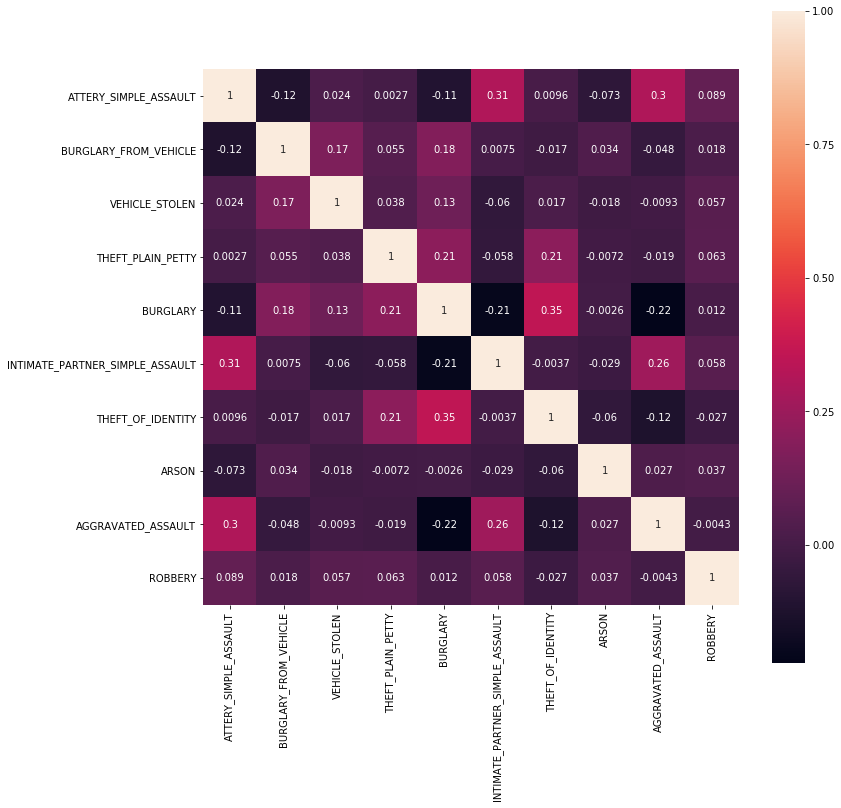

In [50]:
f, ax = plt.subplots(figsize=(12,12))
sns.heatmap(NewDataSetLosAngeles.corr(),square=True,ax=ax,annot=True)
plt.show()

As seen from the correlation matrix, the new dataset is more interesting because it has more correlations between crimes, making it easier to perform linear regression.

In [51]:
def LinearRegression(DataSet,CrimeName='BURGLARY'):
    
    Crime = DataSet.drop(['Date_Occurred',CrimeName], axis=1)

    y = np.array([DataSet[CrimeName].iloc[x] for x in range(len(DataSet)-1)])
    x = np.array([[Crime[key][index] for index in range(len(Crime)-1)]for key in Crime.keys()])
    
    ones = np.ones(len(x[0]))
    X = sm.add_constant(np.column_stack((x[0], ones)))
    for ele in x[1:]:
        X = sm.add_constant(np.column_stack((ele, X)))
    
    result = sm.OLS(y, X).fit()
    params = result.params
    tvalue = result.tvalues
    predict = pd.DataFrame(result.predict() )
    
    print(result.summary()) 
    print('====================================================================================================')
    
    
    fig = plt.figure(figsize=(12,15))
    fig = sm.graphics.plot_partregress_grid(result, fig=fig) 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     12.52
Date:                Tue, 12 Jun 2018   Prob (F-statistic):           2.73e-17
Time:                        21:35:54   Log-Likelihood:                -1277.4
No. Observations:                 365   AIC:                             2575.
Df Residuals:                     355   BIC:                             2614.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0244      0.080      0.306      0.7

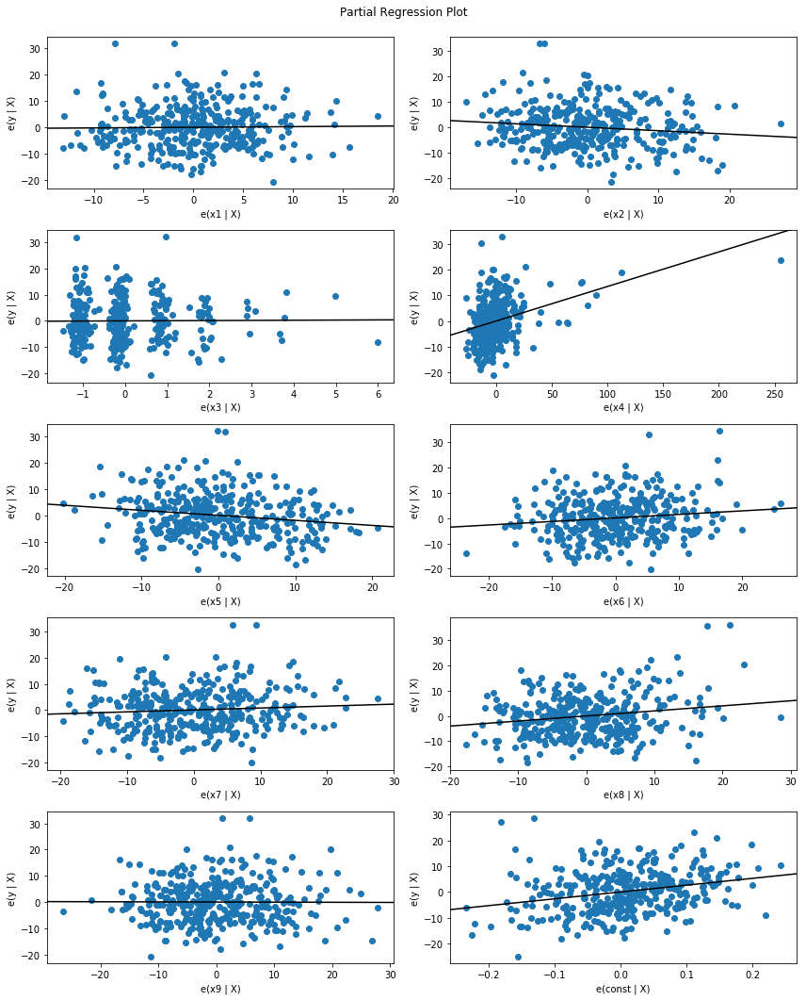

In [52]:
LinearRegression(NewDataSetLosAngeles)

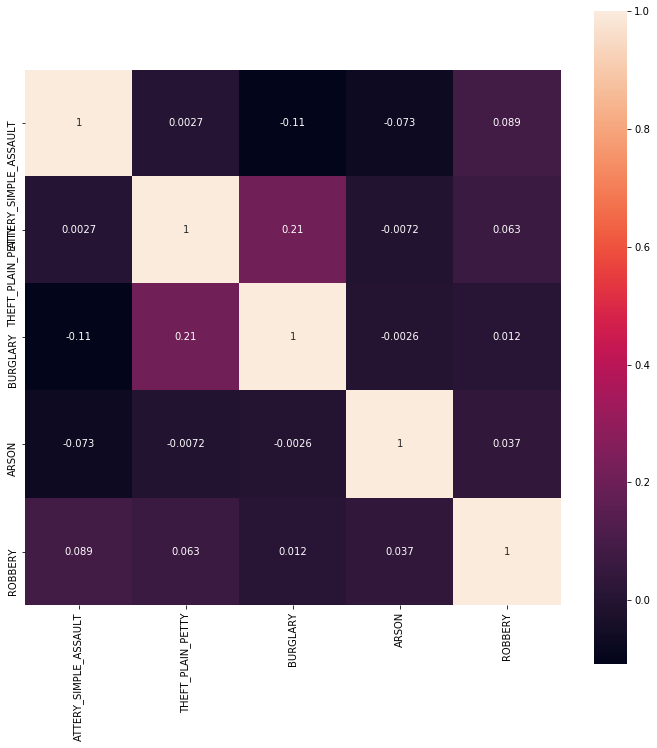

In [53]:
NewAnalisis = NewDataSetLosAngeles.drop(['BURGLARY_FROM_VEHICLE',\
                                         'VEHICLE_STOLEN',\
                                         'INTIMATE_PARTNER_SIMPLE_ASSAULT',\
                                         'THEFT_OF_IDENTITY',\
                                         'AGGRAVATED_ASSAULT'], axis=1)

f, ax = plt.subplots(figsize=(12,12))
sns.heatmap(NewAnalisis.corr(),square=True,ax=ax,annot=True)
plt.show()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     5.366
Date:                Tue, 12 Jun 2018   Prob (F-statistic):           0.000331
Time:                        21:35:56   Log-Likelihood:                -1317.1
No. Observations:                 365   AIC:                             2644.
Df Residuals:                     360   BIC:                             2664.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0139      0.088      0.158      0.8

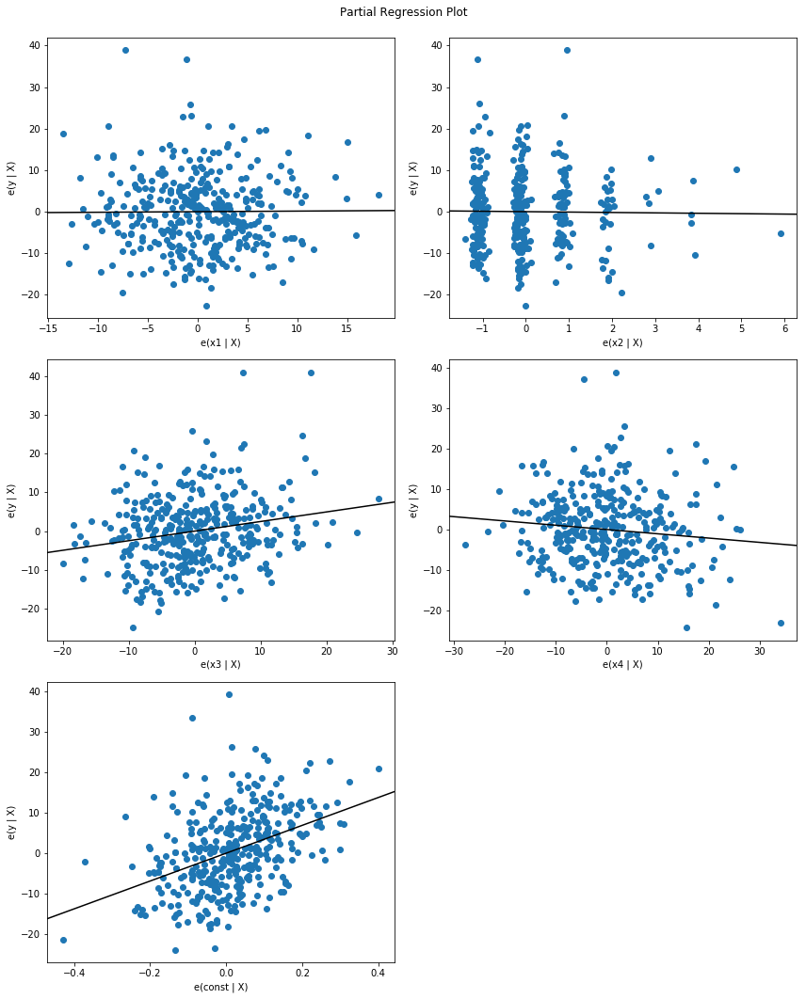

In [54]:
LinearRegression(NewAnalisis)

<p>. P>|t| – This column shows the 2-tailed p-values used in testing the null hypothesis that the coefficient (parameter) is 0.   Using an alpha of 0.05.

The coefficient for ATTERY-SIMPLE- ASSAULT is significantly different from 0 because its p-value is 0.001, which is smaller than 0.05.

The coefficient for BULGLARY-FROM-VECHICLE is not statictically significant at the 0.05 level since the p-value is 0.063 which is greater than 0.05.
   
The coefficient for VECHCLE-STOLEN is not statistically significantly different from 0 because its p-value is 0.354 which definitely larger than 0.05.

The coefficient for THEFT- PLAIN-PETTY is  statistically significantly different from 0 because its p-value is 0.000, which is smaller than 0.05.

The coefficient for BULGLARY is not statictically significant at the 0.05 level since the p-value is 0.172 which is greater than 0.05.

The coefficient for INTIMATE-PARTNER-SIMPLE ASSAULT is not statistically significantly different from 0 because its p-value is 0.438 which definitely larger than 0.05.

The coefficient for THEFT OF INDENTITY is not statistically significantly different from 0 because its p-value is 0.100 which definitely larger than 0.05.


The coefficient for ARSON is significantly different from 0 because its p-value is 0.001, which is smaller than 0.05.

The coefficient for AGGRAVATED ASSAULT is not statictically significant at the 0.05 level since the p-value is 0.350 which is greater than 0.05.

The coefficient for ROBBERY is significantly different from 0 because its p-value is 0.007, which is smaller than 0.05. 

<P/>




In [55]:
def Prediction(DataSet):
    
    print('PREDICTIONS:')
    for currentCrime in DataSet.keys():
        if currentCrime != 'Date_Occurred':
            Crime = DataSet.drop(['Date_Occurred',currentCrime], axis=1)

            y = np.array([DataSet[currentCrime].iloc[x] for x in range(len(DataSet)-1)])
            x = np.array([[Crime[key][index] for index in range(len(Crime)-1)]for key in Crime.keys()])

            ones = np.ones(len(x[0]))
            X = sm.add_constant(np.column_stack((x[0], ones)))
            for ele in x[1:]:
                X = sm.add_constant(np.column_stack((ele, X)))

            result = sm.OLS(y, X).fit()
            params = result.params
            tvalue = result.tvalues
            predict = pd.DataFrame(result.predict()).sum()

            print('%35s in 2017: %d' %  (currentCrime, predict.iloc[0]))

In [56]:
Prediction(NewDataSetLosAngeles)

PREDICTIONS:
              ATTERY_SIMPLE_ASSAULT in 2017: 17872
              BURGLARY_FROM_VEHICLE in 2017: 16707
                     VEHICLE_STOLEN in 2017: 18232
                  THEFT_PLAIN_PETTY in 2017: 14711
                           BURGLARY in 2017: 14423
    INTIMATE_PARTNER_SIMPLE_ASSAULT in 2017: 12348
                  THEFT_OF_IDENTITY in 2017: 12631
                              ARSON in 2017: 408
                 AGGRAVATED_ASSAULT in 2017: 10769
                            ROBBERY in 2017: 9040


<h2><b>Solution:</b></h2><br>  8)  We will be running different algorithms of regression and then choose the best one for prediction.<br>

In [57]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import BaggingRegressor
from sklearn import model_selection
from pandas import DataFrame, get_dummies
from sklearn.model_selection import train_test_split
mtl.rcParams['agg.path.chunksize'] = 10000

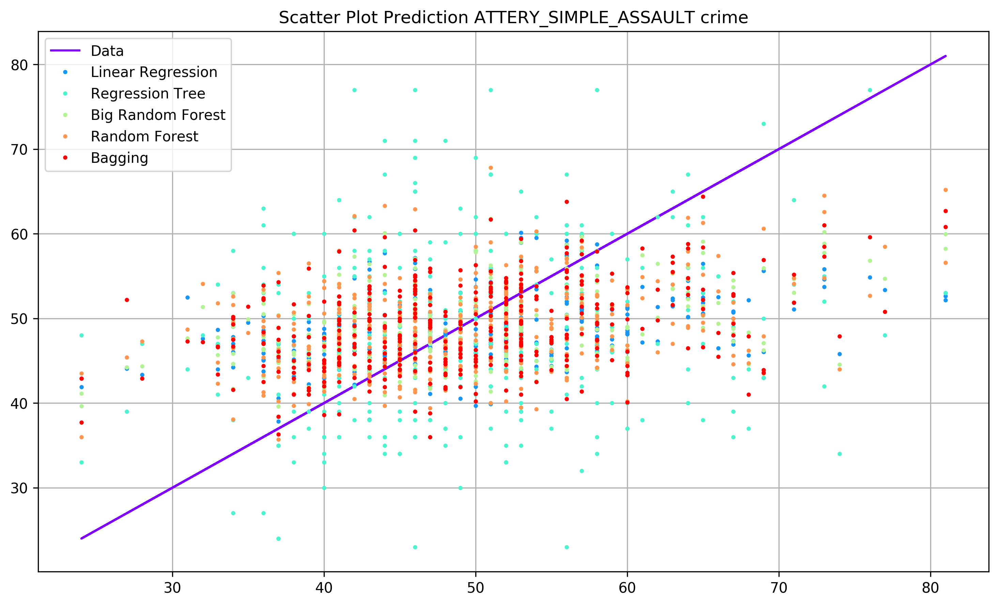

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression         0.048818            17979
Regression Tree          -1.117071            17911
Big Random Forest         0.024578            17976
Random Forest            -0.110221            18036
Bagging                  -0.023104            18027


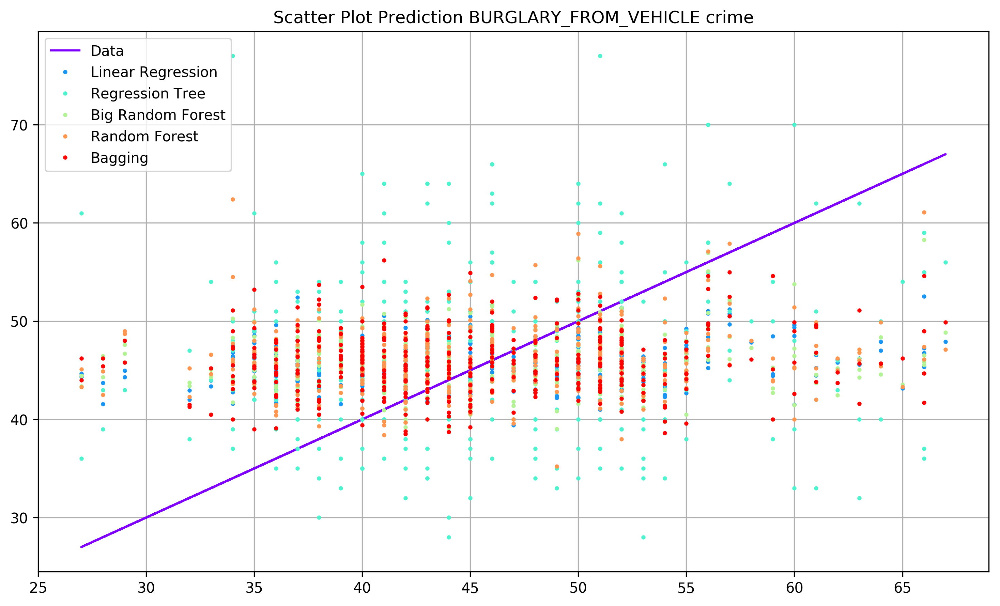

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression        -0.071980            16836
Regression Tree          -1.031290            17196
Big Random Forest        -0.177723            16881
Random Forest            -0.275252            16986
Bagging                  -0.248991            16892


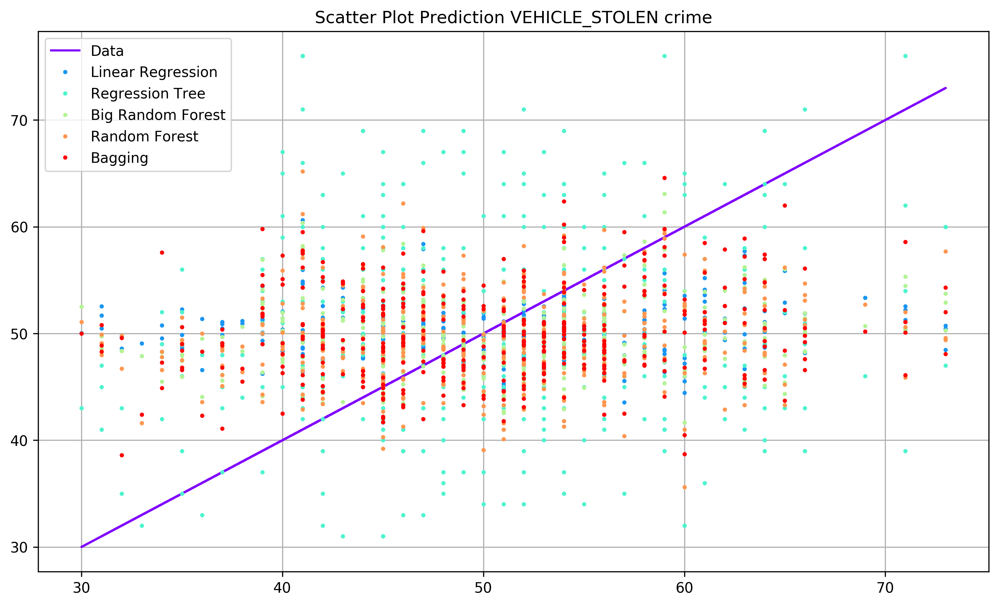

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression        -0.284435            18431
Regression Tree          -1.355278            18690
Big Random Forest        -0.240847            18375
Random Forest            -0.366428            18202
Bagging                  -0.358830            18395


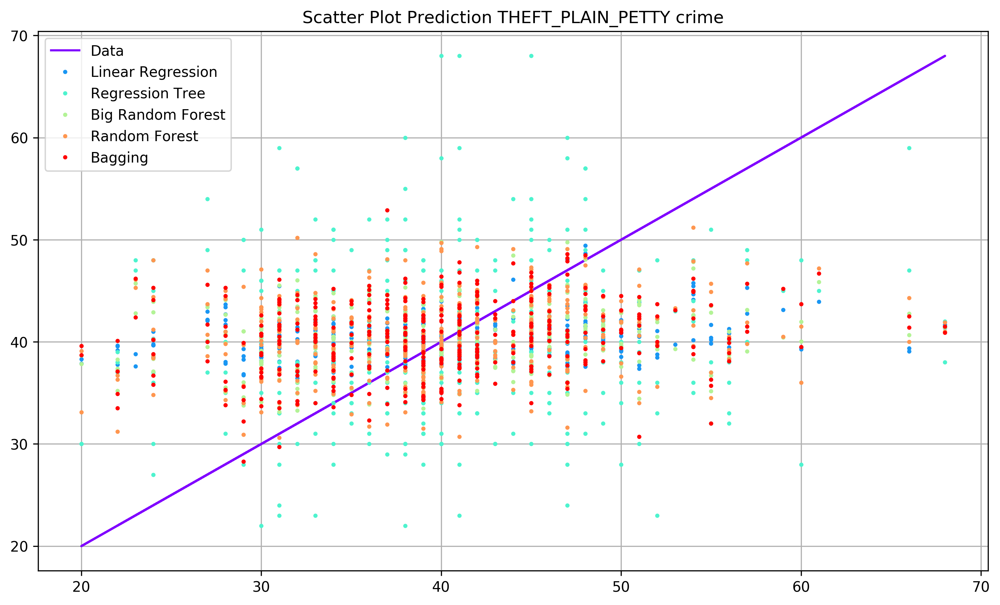

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression        -0.189530            14841
Regression Tree          -1.120711            14853
Big Random Forest        -0.129396            14888
Random Forest            -0.191833            14903
Bagging                  -0.189136            14871


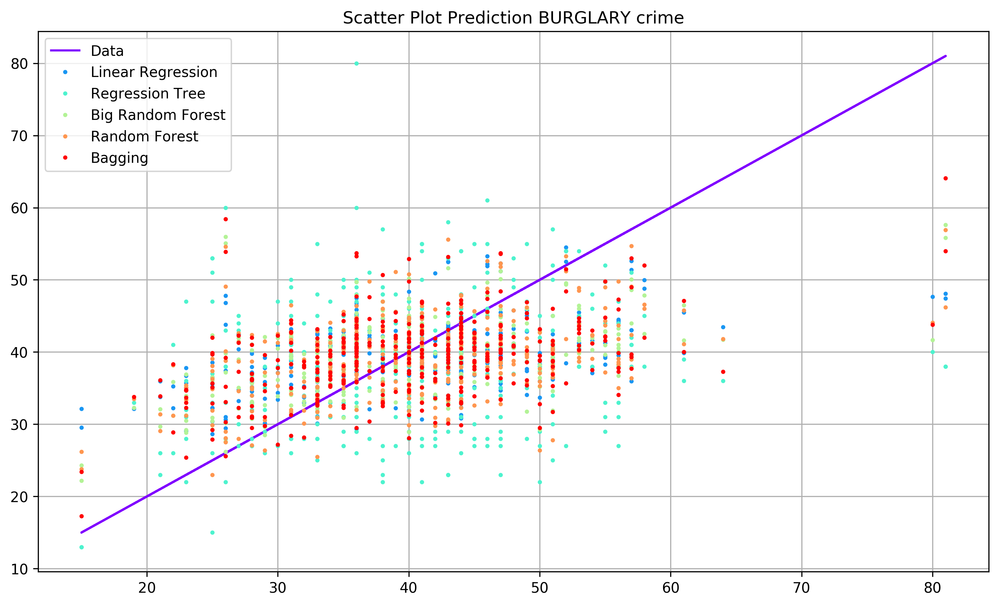

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression         0.163260            14658
Regression Tree          -0.732090            14131
Big Random Forest         0.109091            14488
Random Forest             0.001447            14441
Bagging                   0.034005            14499


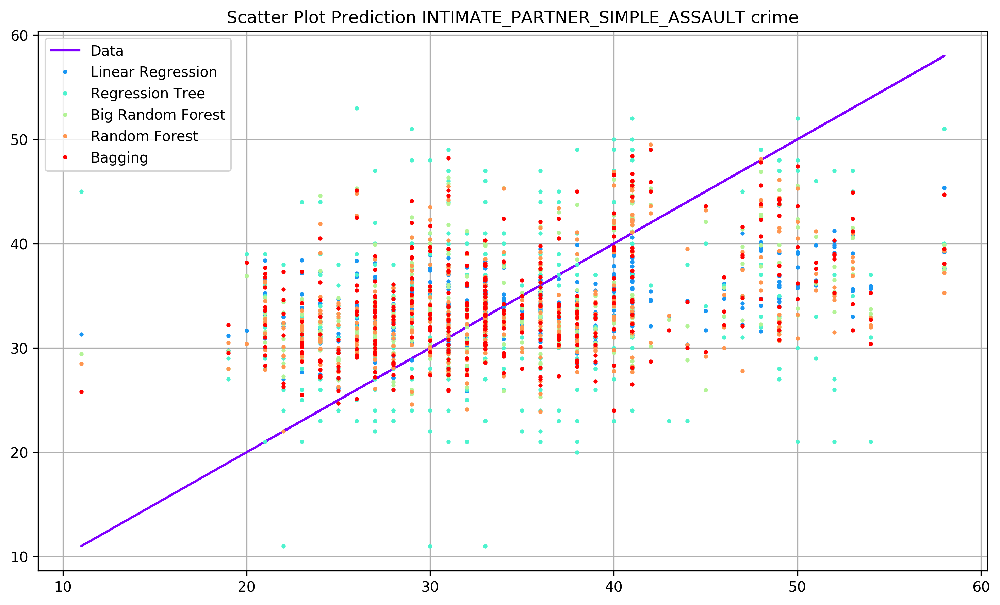

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression         0.070076            12504
Regression Tree          -0.768019            12431
Big Random Forest         0.101980            12525
Random Forest             0.011896            12457
Bagging                   0.006224            12574


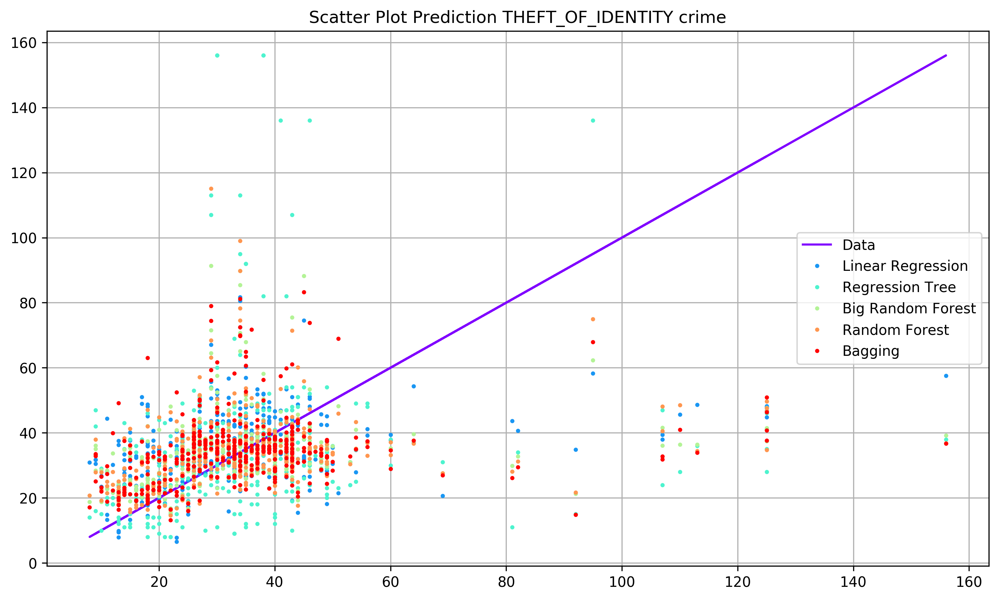

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression         0.009202            13089
Regression Tree          -0.581242            12856
Big Random Forest        -0.197532            12741
Random Forest            -0.366374            12697
Bagging                  -0.322555            12731


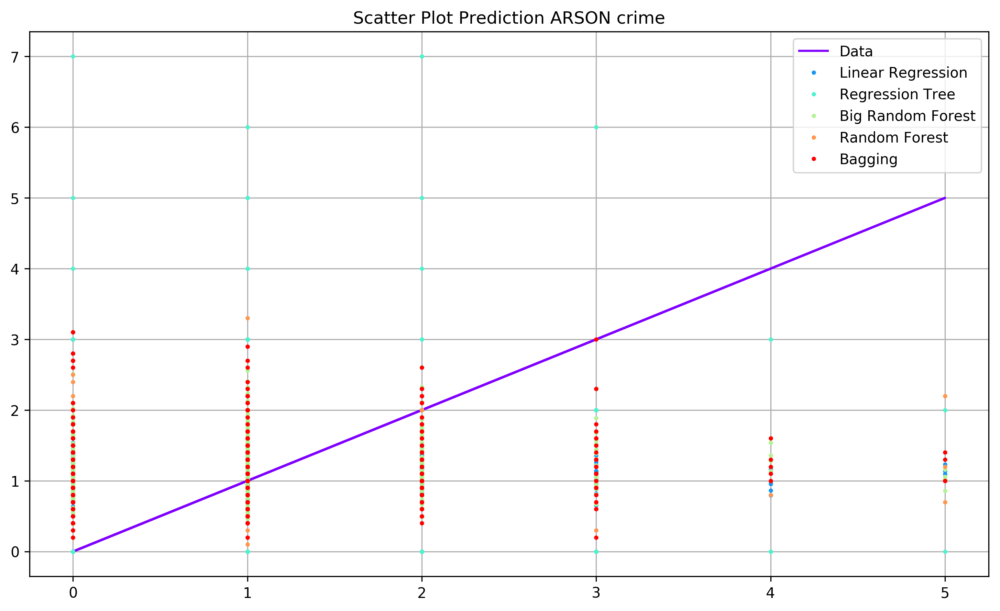

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression        -0.043738              419
Regression Tree          -1.020989              445
Big Random Forest        -0.181765              442
Random Forest            -0.301733              441
Bagging                  -0.278075              447


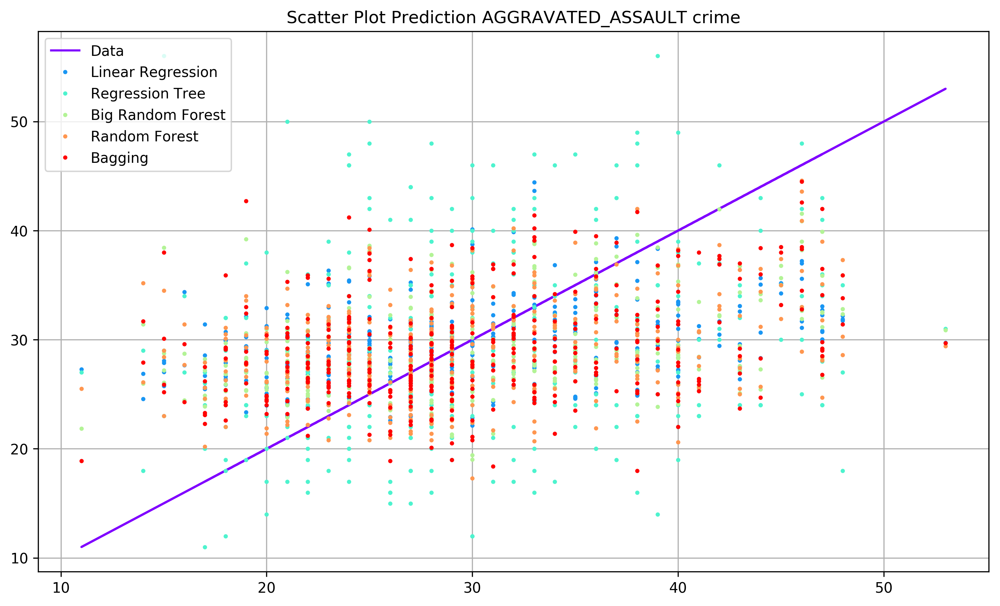

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression         0.052628            10887
Regression Tree          -0.774403            10831
Big Random Forest         0.055047            10777
Random Forest            -0.022240            10713
Bagging                   0.034017            10766


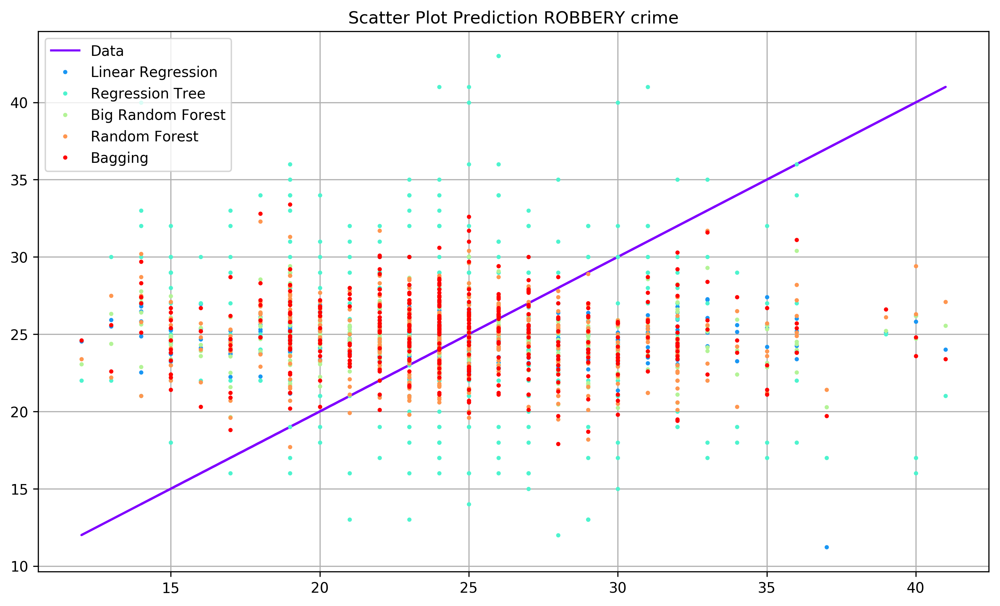

                   Medium_Accuracy  Prediction_2017
Label                                              
Linear Regression        -0.236499             9107
Regression Tree          -1.637177             9457
Big Random Forest        -0.327144             9116
Random Forest            -0.478627             9094
Bagging                  -0.362877             9214


In [58]:
NewDataSetLosAngeles = NewDataSetLosAngeles.drop("Date_Occurred", axis=1)


for crime in NewDataSetLosAngeles.keys():

    AlgorithmSequence = {"Label":["Linear Regression",\
                                  "Regression Tree",\
                                  "Big Random Forest",\
                                  "Random Forest", 
                                  "Bagging"], 
                   "Functions" : [lambda : LinearRegression(),\
                                  lambda : DecisionTreeRegressor(),\
                                  lambda : RandomForestRegressor(n_estimators=100),\
                                  lambda : RandomForestRegressor(),\
                                  lambda : BaggingRegressor()], 
                   "Predictions":[[] for _ in range(5)]}

    actuals = []

    [_.shape for _ in  train_test_split(NewDataSetLosAngeles.drop(crime, axis=1),\
                                        NewDataSetLosAngeles[crime], test_size=0.25)]


    for _ in range (4):
        train_X, test_X, train_y, test_y = (
            train_test_split(NewDataSetLosAngeles.drop(crime, axis=1), 
                             NewDataSetLosAngeles[crime], test_size=0.25))
        for i, obj_factory in enumerate(AlgorithmSequence["Functions"]):
            obj = obj_factory()
            obj.fit(y=train_y,X=train_X)
            AlgorithmSequence["Predictions"][i] += list(obj.predict(test_X))
        actuals += list(test_y)
    actuals = pd.Series(actuals)
    AlgorithmSequence["Predictions"] = list(map(pd.Series, AlgorithmSequence["Predictions"]))



    color=iter(cm.rainbow(np.linspace(0,1,len(AlgorithmSequence)+3)))
    plt.figure(figsize=(12,7),dpi=300)
    plt.plot(actuals,actuals,c=next(color),markersize=2,label='Data')

    for _, row in DataFrame(AlgorithmSequence).iterrows():
        plt.plot(actuals, row["Predictions"],'o',c=next(color),
                 markersize=2,label=row['Label'])

    plt.title('Scatter Plot Prediction '+crime+' crime')
    plt.grid(True)
    plt.legend()
    plt.show()


    AlgorithmSequence["Medium_Accuracy"] = []
    for o in AlgorithmSequence["Functions"]:
        AlgorithmSequence["Medium_Accuracy"].append(
            model_selection.cross_val_score(o(), y=NewDataSetLosAngeles[crime],\
                                            X=NewDataSetLosAngeles.drop(crime, axis=1),\
                                            cv=5).mean())
        
    AlgorithmSequence["Prediction_2017"] = []
    for i in AlgorithmSequence["Predictions"]:
        AlgorithmSequence["Prediction_2017"].append(int(i.sum()))
        
        

    print(DataFrame(AlgorithmSequence).drop(["Functions", "Predictions"], axis=1).set_index("Label"))

<p>In our Study we applied five different algorithms of regression such as LINEAR REGRESSION, REGRESSION TREE, BIG RANDOM FPREST,RANDOM FPREST and BAGGING  on the various variables to obtain the scatter plot for prdection, we found out that the  LINEAR REGRESSION has the greatest number among the different algorithms of regression which lead to the best fitting REGRESSION CURVE for prediction.

In conlcusion from our study we can say that the  LINEAR REGRESSION is the best method for prediction.<p/><br>

<h3>Real Data for 2017 vs Our prediction</h3>

In [59]:
LA_2017 = DataSetLosAngeles[DataSetLosAngeles['Date_Occurred'].str.contains("2017")]
LA_2017['Date_Occurred'] = pd.to_datetime(LA_2017['Date_Occurred'])

LA_2017 = LA_2017[['Date_Occurred','Crime_Code','Crime_Code_Description','N']].groupby(by=['Date_Occurred','Crime_Code','Crime_Code_Description'],as_index=False).sum()


Prediction: <b>17872</b>

In [60]:
LA_2017[LA_2017['Crime_Code'] == 624].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,624,BATTERY - SIMPLE ASSAULT,12701


Prediction: <b>16707</b>

In [61]:
LA_2017[LA_2017['Crime_Code'] == 330].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,330,BURGLARY FROM VEHICLE,12062


Prediction: <b>18232</b>

In [62]:
LA_2017[LA_2017['Crime_Code'] == 510].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,510,VEHICLE - STOLEN,12717


Prediction: <b>14711</b>

In [63]:
LA_2017[LA_2017['Crime_Code'] == 440].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,440,THEFT PLAIN - PETTY ($950 & UNDER),9523


Prediction: <b>14423</b>

In [64]:
LA_2017[LA_2017['Crime_Code'] == 310].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,310,BURGLARY,9964


Prediction: <b>12348</b>

In [65]:
LA_2017[LA_2017['Crime_Code'] == 626].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,626,INTIMATE PARTNER - SIMPLE ASSAULT,8608


Prediction: <b>12631</b>

In [66]:
LA_2017[LA_2017['Crime_Code'] == 354].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,354,THEFT OF IDENTITY,7204


Prediction: <b>408</b>

In [67]:
LA_2017[LA_2017['Crime_Code'] == 648].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,648,ARSON,276


Prediction: <b>10769</b>

In [68]:
LA_2017[LA_2017['Crime_Code'] == 230].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",7516


Prediction: <b>9040</b>

In [69]:
LA_2017[LA_2017['Crime_Code'] == 210].groupby(by=['Crime_Code','Crime_Code_Description'],as_index=False).sum()

,Crime_Code,Crime_Code_Description,N
0,210,ROBBERY,6464


In [70]:
Data = pd.read_csv('dataset/2016-2017.csv',sep=';').fillna(method='ffill') 

<h3><b>FBI prediction vs Our prediction</b></h3>

In [71]:
Data = Data[Data['City'] == 'LOS ANGELES']
Data[Data['Year'] == 2017]

,State,City,Year,Population,Violent crime,Murder,Rape,Robbery,Aggravated assault,Property crime,Burglary,Larceny theft,Motor vehicle theft,Arson
85,CALIFORNIA,LOS ANGELES,2017,4.007.905,14.44,138,1.212,5.165,7.925,50.122,8.252,32.363,9.507,651.0


<b>ARSON</b> Prediction: <b>408</b><br>
<b>BURGLARY</b> Prediction: <b>14423</b><br>
<b>ROBBERY</b> Prediction: <b>9040</b><br>
<b>AGGRAVATED ASSAULT</b> Prediction: <b>7516</b><br>